In [1]:
import sys

%load_ext autoreload

%autoreload 2

import river.cluster as rcluster
from sklearn.preprocessing import MinMaxScaler
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as ptc
from clustpy.partition import XMeans
from sklearn.cluster import KMeans, HDBSCAN
from dbhd_clustering.DBHDALGO import DBHD
from clustpy.metrics import unsupervised_clustering_accuracy, PairCountingScores
from river import metrics as rmetrics
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

from evaluate import printMetrics 
from datahandler import load_data

from scipy.spatial import Voronoi, voronoi_plot_2d

(3031, 2)
3031


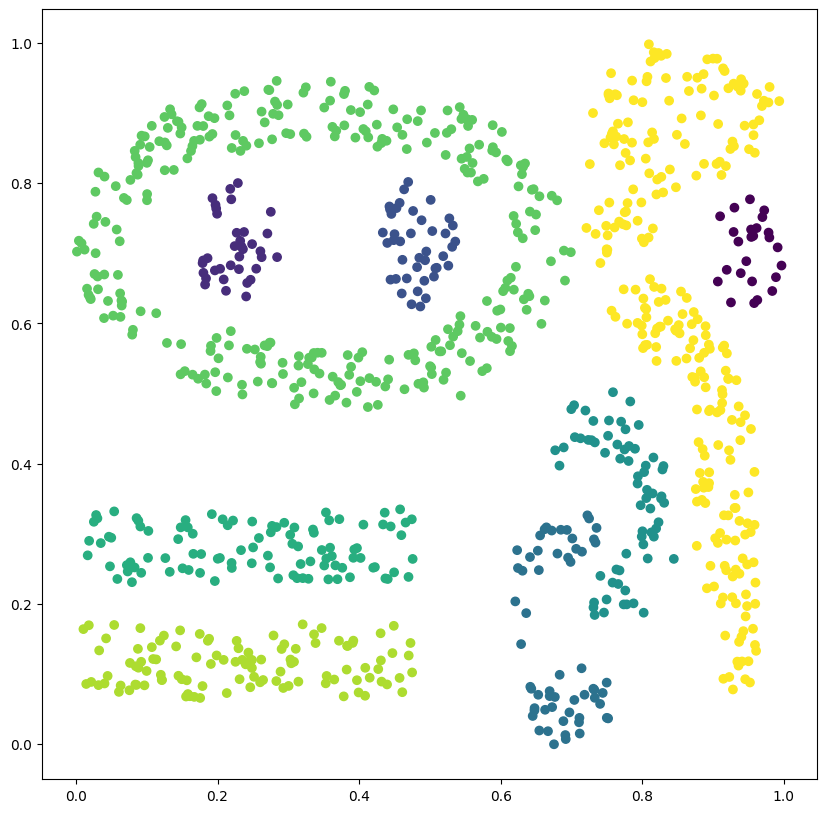

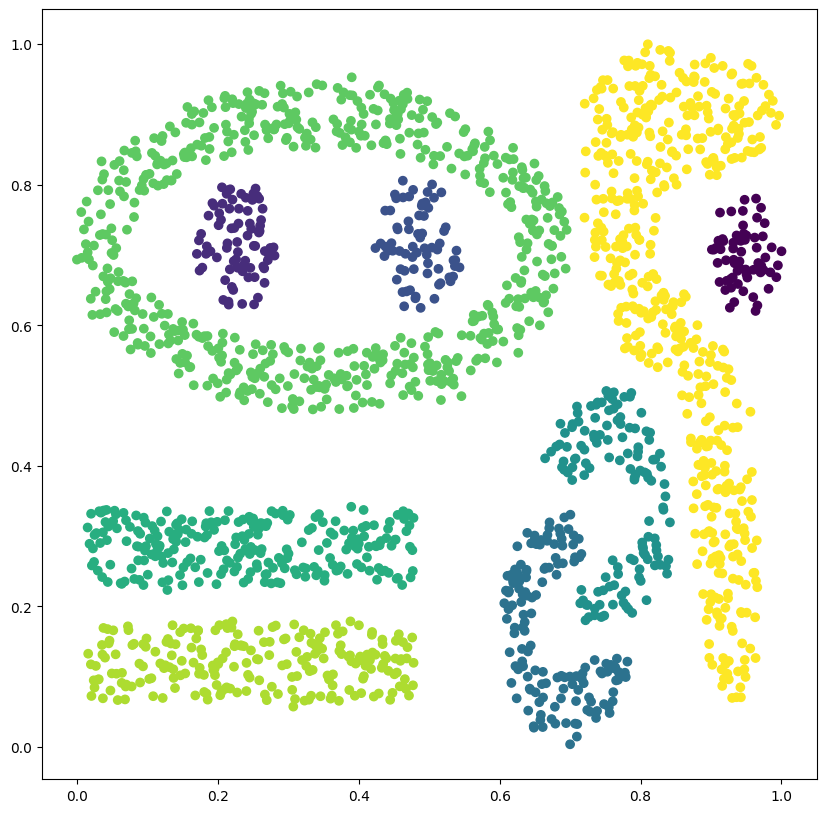

In [2]:
X, y = load_data("complex9", "artificial", 2)
print(X.shape)
print(len(y))
c = 1000
X_test = X[c:]
y_test = y[c:]
X = X[:c]
y = y[:c]
plt.figure(figsize=(10,10))
plt.scatter(X[:, 0], X[:, 1], c=y)
plt.show()
plt.figure(figsize=(10,10))
plt.scatter(X_test[:, 0], X_test[:, 1], c=y_test)
plt.show()

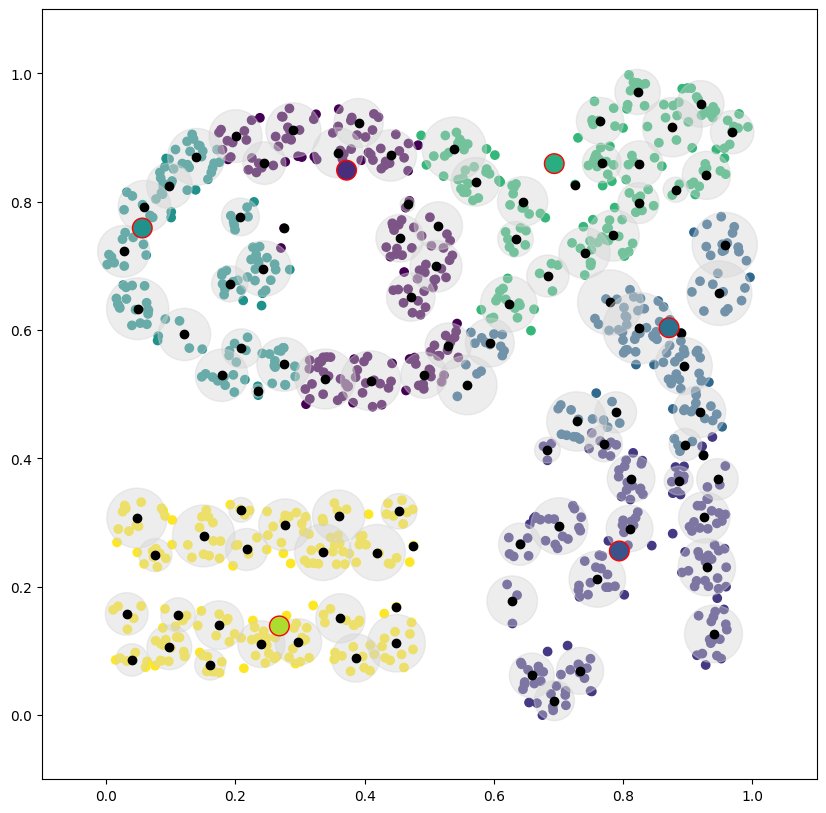

    0   1     2    3    4     5     6   7     8  
0   0     0    0   25     0     0   0     0   0  
1   0     2    0    0    34     0   0     0   0  
2   0    41    0    0     0     0   0     0   0  
3   0     0   59    0     0     0   0     0   0  
4   0     0   51   15     0     0   0     0   0  
5   0     0    0    0     0     0   0   100   0  
6   0   122    0   14   105    66   0     0   0  
7   0     0    0    0     0     0   0   108   0  
8   0     0   67   77     0   114   0     0   0  
Acc: 0.462 NMI: 0.5970311699077122 ARI: 0.34699267438474357 AMI: 0.5924438295153043 Pur.: 0.593 Prec.: 0.49682969946965233 Rec.: 0.4370399552136681 F1: 0.4650208485008935 Comp.: 0.612517502900259 Fowl.: 0.46597685522463134 Homo.: 0.5823086109428035 Clu.Num.: 6 True Clu.Num 9


In [3]:
from utils import dict_to_np, dps_to_np
from competitors.clustream import CluStream
clustream = CluStream(n_macro_clusters=9, max_micro_clusters=100, sigma=0.5, mu=0.5, seed=0, time_gap=10000)
for x in X:
	dp = dict(enumerate(x))
	clustream.learn_one(dp)
clustream_labels_train = []
for x in X:
	dp = dict(enumerate(x))
	pred = clustream.predict_one(dp, recluster=True)
	clustream_labels_train.append(pred)

#vor = Voronoi(dps_to_np(clustream.centers.values()))
clustream_centers = dps_to_np(clustream.centers.values())
plt.figure(figsize=(10, 10))
#voronoi_plot_2d(vor, show_vertices=False, show_points=False)
plt.scatter(X[:, 0], X[:, 1], c=clustream_labels_train)
for id, mc in clustream.micro_clusters.items():
    mccenter = dict_to_np(mc.center)
    mc_patch = ptc.Circle((float(mccenter[0]), float(mccenter[1])), mc.radius(2), alpha=0.4, color="lightgrey")
    plt.gca().add_patch(mc_patch)
    plt.scatter(float(mccenter[0]), float(mccenter[1]), c="black")
plt.scatter(clustream_centers[:, 0], clustream_centers[:,1], c=clustream.centers.keys(), s= 200, edgecolors='red')
plt.ylim(-0.1, 1.1)
plt.xlim(-0.1, 1.1)
plt.show()
       
print(printMetrics(y, clustream_labels_train))

C:\Users\Philipp-LMU\Workspaces\streaming_clustream\venvClu\lib\site-packages\joblib\externals\loky\backend\context.py:136: UserWarning: Could not find the number of physical cores for the following reason:
found 0 physical cores < 1
Returning the number of logical cores instead. You can silence this warning by setting LOKY_MAX_CPU_COUNT to the number of cores you want to use.
  warnings.warn(
  File "C:\Users\Philipp-LMU\Workspaces\streaming_clustream\venvClu\lib\site-packages\joblib\externals\loky\backend\context.py", line 282, in _count_physical_cores
    raise ValueError(f"found {cpu_count_physical} physical cores < 1")


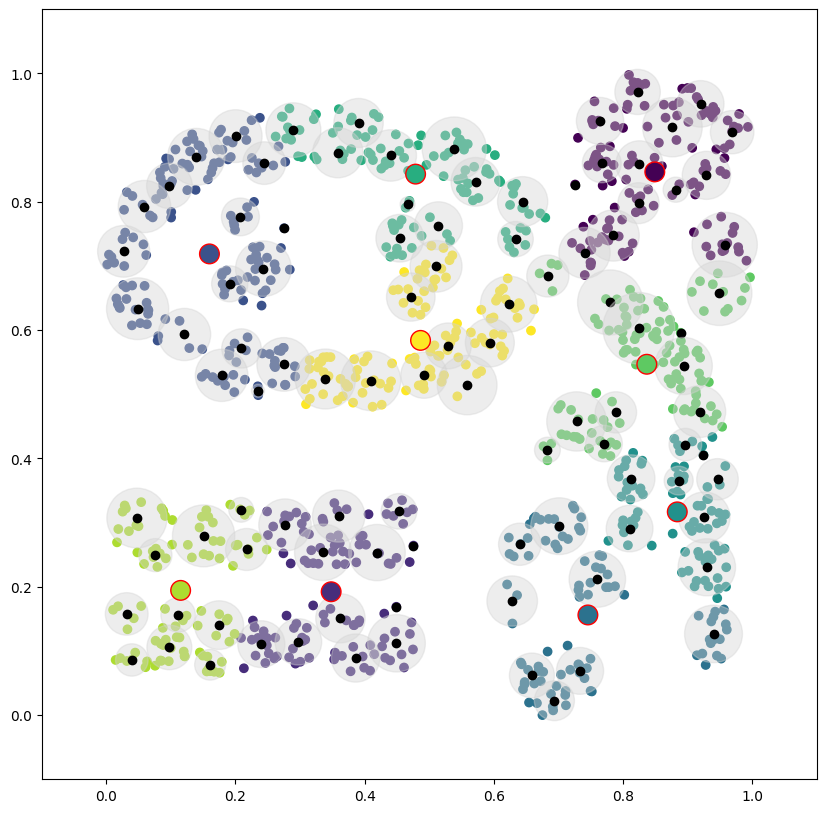

    0     1    2     3    4    5    6    7    8   
0    14    0     0    0    0    0   11    0    0  
1     0    0    36    0    0    0    0    0    0  
2     0    0     0    0    0   18    0    0   23  
3     0    0     0   59    0    0    0    0    0  
4     0    0     0   15   25    0   26    0    0  
5     0   54     0    0    0    0    0   46    0  
6     0    0   124    0    0   91    4    0   88  
7     0   60     0    0    0    0    0   48    0  
8   114    0     0   16   55    0   73    0    0  
Acc: 0.465 NMI: 0.6191406040517221 ARI: 0.36715672415063677 AMI: 0.6127440897855855 Pur.: 0.712 Prec.: 0.6150514347590688 Rec.: 0.36509154243297604 F1: 0.45819861431870673 Comp.: 0.5756276929921633 Fowl.: 0.47386715120569745 Homo.: 0.6697699249279763 Clu.Num.: 9 True Clu.Num 9


In [4]:
from competitors.clustream import CluStream
clustream2 = CluStream(n_macro_clusters=9, max_micro_clusters=100, sigma=0.5, mu=0.5, seed=0, time_gap=10000)
for x in X:
	dp = dict(enumerate(x))
	clustream2.learn_one(dp)
clustream2_labels_train = []
for x in X:
	dp = dict(enumerate(x))
	pred = clustream2.predict_one(dp, recluster=True, sklearn=True)
	clustream2_labels_train.append(pred)
    
clustream_centers = clustream2._kmeans.cluster_centers_
plt.figure(figsize=(10, 10))
plt.scatter(X[:, 0], X[:, 1], c=clustream2_labels_train)
for id, mc in clustream2.micro_clusters.items():
    mccenter = dict_to_np(mc.center)
    mc_patch = ptc.Circle((float(mccenter[0]), float(mccenter[1])), mc.radius(2), alpha=0.4, color="lightgrey")
    plt.gca().add_patch(mc_patch)
    plt.scatter(float(mccenter[0]), float(mccenter[1]), c="black")
plt.scatter(clustream_centers[:, 0], clustream_centers[:,1], c=range(len(clustream_centers)), s= 200, edgecolors='red')

plt.ylim(-0.1, 1.1)
plt.xlim(-0.1, 1.1)
plt.show()
       
print(printMetrics(y, clustream2_labels_train))

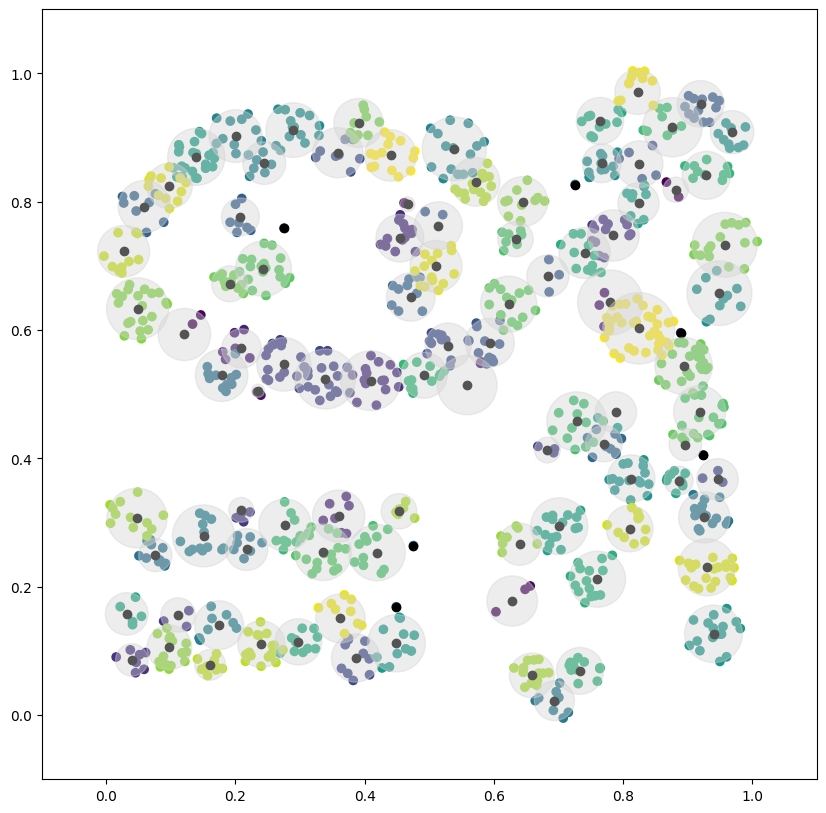

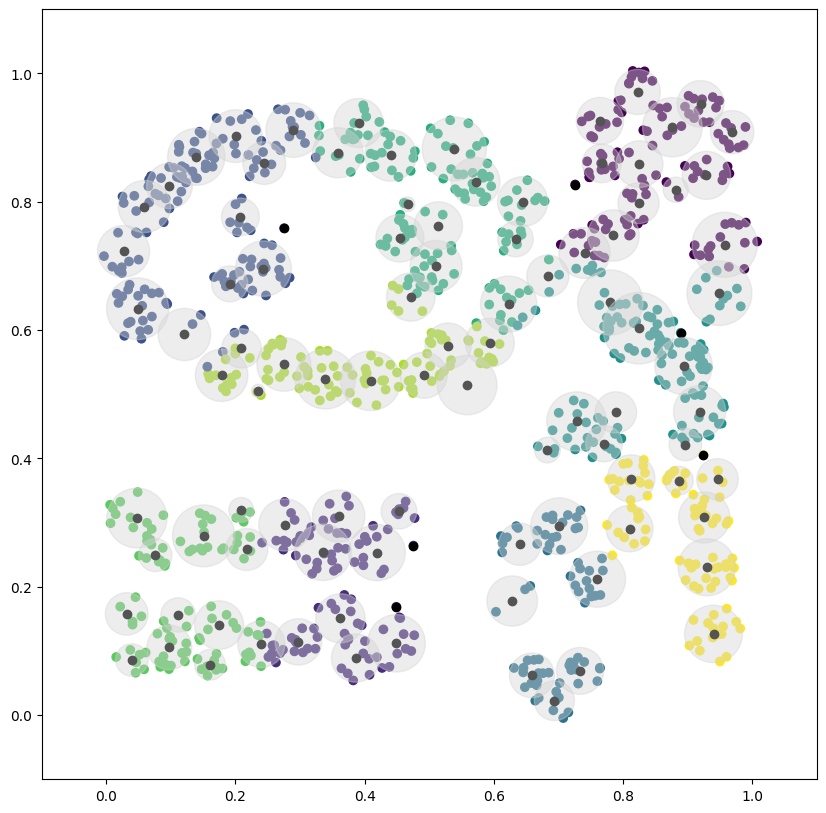

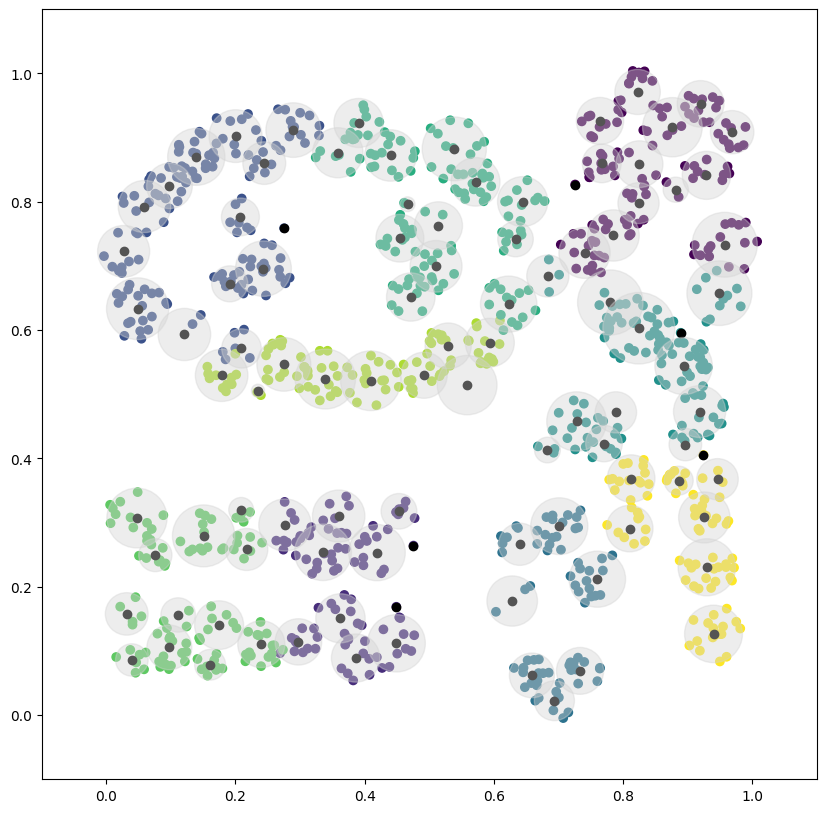

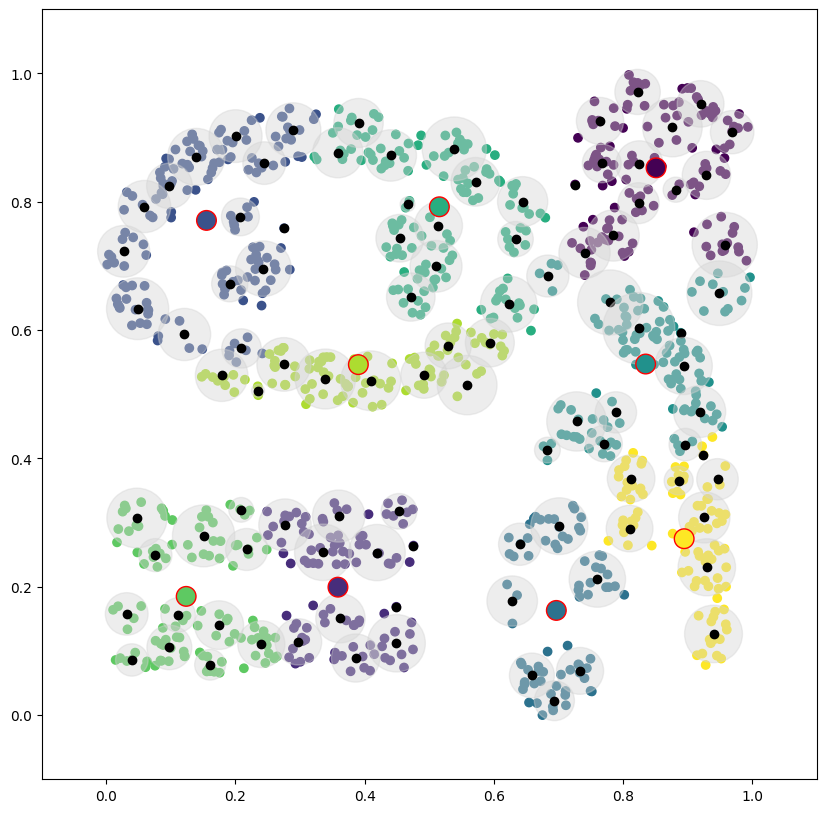

    0     1    2     3    4    5    6    7    8   
0    14    0     0    0   11    0    0    0    0  
1     0    0    36    0    0    0    0    0    0  
2     0    0     0    0    0   41    0    0    0  
3     0    0     0   59    0    0    0    0    0  
4     0    0     0   15   26    0    0    0   25  
5     0   54     0    0    0    0   46    0    0  
6     0    0   113    0    4   93    0   97    0  
7     0   43     0    0    0    0   65    0    0  
8   114    0     0    0   77    0    0    0   67  
Acc: 0.502 NMI: 0.6510025469929697 ARI: 0.38404615351018323 AMI: 0.6451382431436553 Pur.: 0.739 Prec.: 0.6343763095404386 Rec.: 0.37666134483402103 F1: 0.47267286801535163 Comp.: 0.6053770815962102 Fowl.: 0.4888200424311024 Homo.: 0.7040658938801122 Clu.Num.: 9 True Clu.Num 9


In [5]:
from method.offlineHandler import GenCluStream
genclustream = GenCluStream(n_macro_clusters=9, max_micro_clusters=100, sigma=0.5, mu=0.5, seed=0, time_gap=10000, offline_datascale=1000)
for x in X:
	dp = dict(enumerate(x))
	genclustream.learn_one(dp)
genclustream_labels_train = []
for x in X:
	dp = dict(enumerate(x))
	pred = genclustream.predict_one(dp)
	genclustream_labels_train.append(pred)
    
clustream_centers = genclustream.centers
plt.figure(figsize=(10, 10))
plt.scatter(X[:, 0], X[:, 1], c=genclustream_labels_train)
for id, mc in genclustream.micro_clusters.items():
    mccenter = dict_to_np(mc.center)
    mc_patch = ptc.Circle((float(mccenter[0]), float(mccenter[1])), mc.radius(2), alpha=0.4, color="lightgrey")
    plt.gca().add_patch(mc_patch)
    plt.scatter(float(mccenter[0]), float(mccenter[1]), c="black")
plt.scatter(clustream_centers[:, 0], clustream_centers[:,1], c=range(len(clustream_centers)), s= 200, edgecolors='red')

plt.ylim(-0.1, 1.1)
plt.xlim(-0.1, 1.1)
plt.show()
    
print(printMetrics(y, genclustream_labels_train))

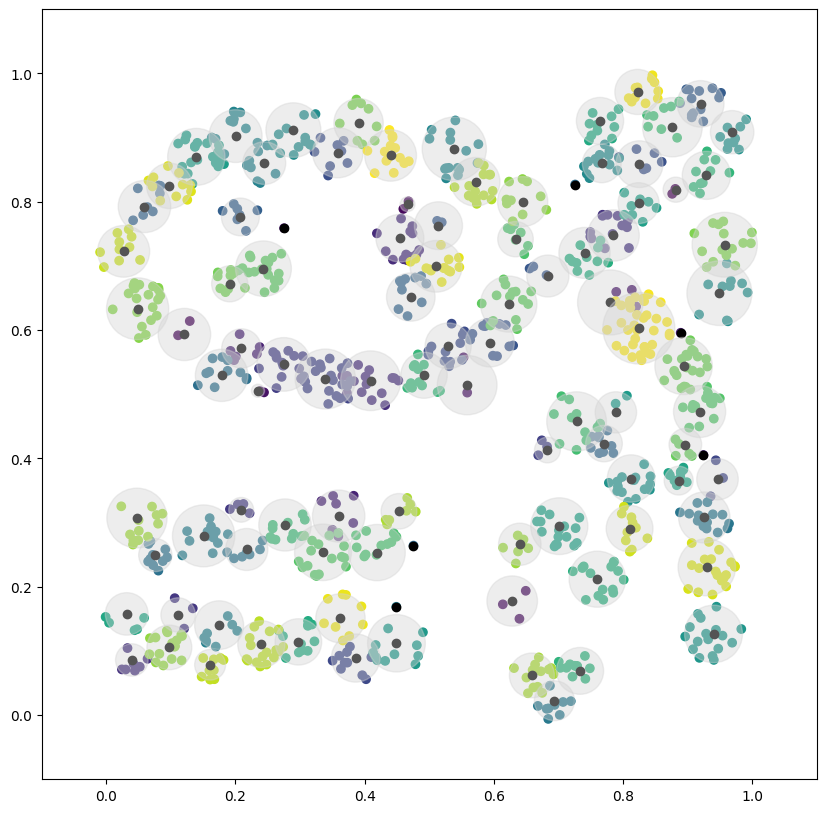

C:\Users\Philipp-LMU\Workspaces\streaming_clustream\venvClu\lib\site-packages\clustpy\partition\xmeans.py:281: RuntimeWarning: invalid value encountered in scalar divide
  cluster_1_and_2_variance = (cluster_variances[c1] * (cluster_sizes[c1] - 1) +


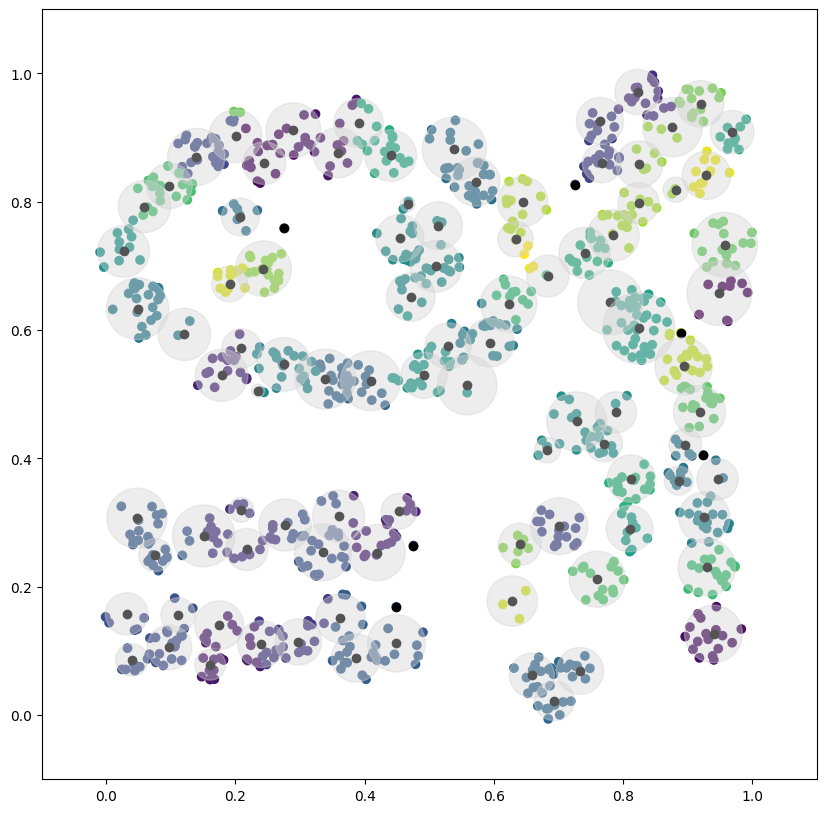

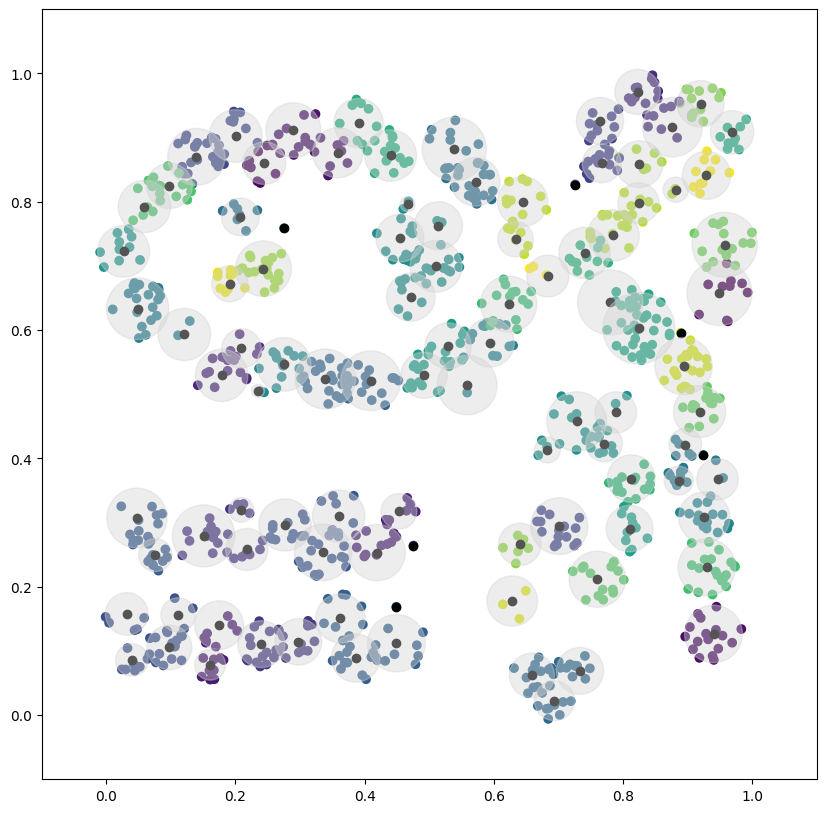

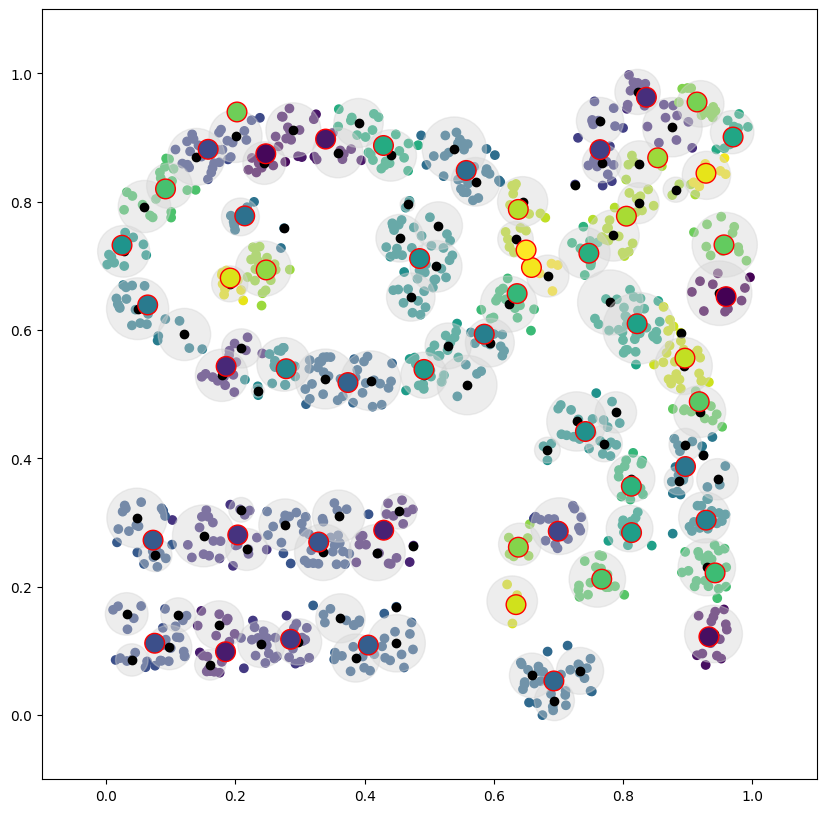

     0    1   2    3    4    5    6    7    8    9    10   11   12   13   14   15   16   17   18   19   20   21   22   23   24   25   26   27   28   29   30   31   32   33   34   35   36   37   38   39   40   41   43   44   45   46   47   48   49   50   51   52   53  
 0   11   0    0    0    0    0    0    0    0    0    0    0    0    0    0    0    0    0    0    0    0    0    0    0    0    0    0    0    0    0    0    0    0    0    0    0    0    0    0    0    0   14    0    0    0    0    0    0    0    0    0    0    0  
 1    0   0    0    0    0    0    0    0    0    0    0    0    0    0    0    0    0    0    0    0    9    0    0    0    0    0    0    0    0    0    0    0    0    0    0    0    0    0    0    0    0    0    0    0   17    0    0    0    0    0   10    0    0  
 2    0   0    0    0    0    0    0    0    0    0    0    0    0    0    0    0    0    0    0    0    0    0    0    0    0    0   41    0    0    0    0    0    0    0    0    0    0    0  

In [6]:
from method.offlineHandler import GenCluStream
genclustream = GenCluStream(n_macro_clusters=9, max_micro_clusters=100, sigma=0.5, mu=0.5, seed=0, time_gap=10000, offline_datascale=1000, offline_algo="XMeans")
for x in X:
	dp = dict(enumerate(x))
	genclustream.learn_one(dp)
genclustream_labels_train = []
for x in X:
	dp = dict(enumerate(x))
	pred = genclustream.predict_one(dp)
	genclustream_labels_train.append(pred)
    
clustream_centers = genclustream.centers
plt.figure(figsize=(10, 10))
plt.scatter(X[:, 0], X[:, 1], c=genclustream_labels_train)
for id, mc in genclustream.micro_clusters.items():
    mccenter = dict_to_np(mc.center)
    mc_patch = ptc.Circle((float(mccenter[0]), float(mccenter[1])), mc.radius(2), alpha=0.4, color="lightgrey")
    plt.gca().add_patch(mc_patch)
    plt.scatter(float(mccenter[0]), float(mccenter[1]), c="black")
plt.scatter(clustream_centers[:, 0], clustream_centers[:,1], c=range(len(clustream_centers)), s= 200, edgecolors='red')

plt.ylim(-0.1, 1.1)
plt.xlim(-0.1, 1.1)
plt.show()
    
print(printMetrics(y, genclustream_labels_train))

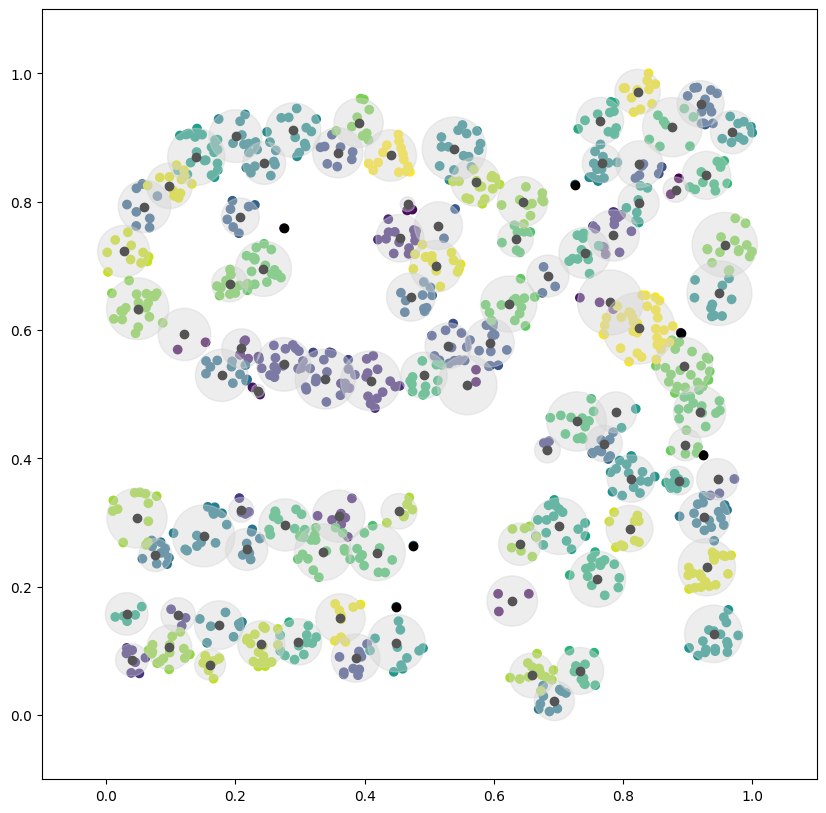

{'min_cluster_size': 50, 'rho': 1.2, 'beta': 0.2, 'seed': 0}


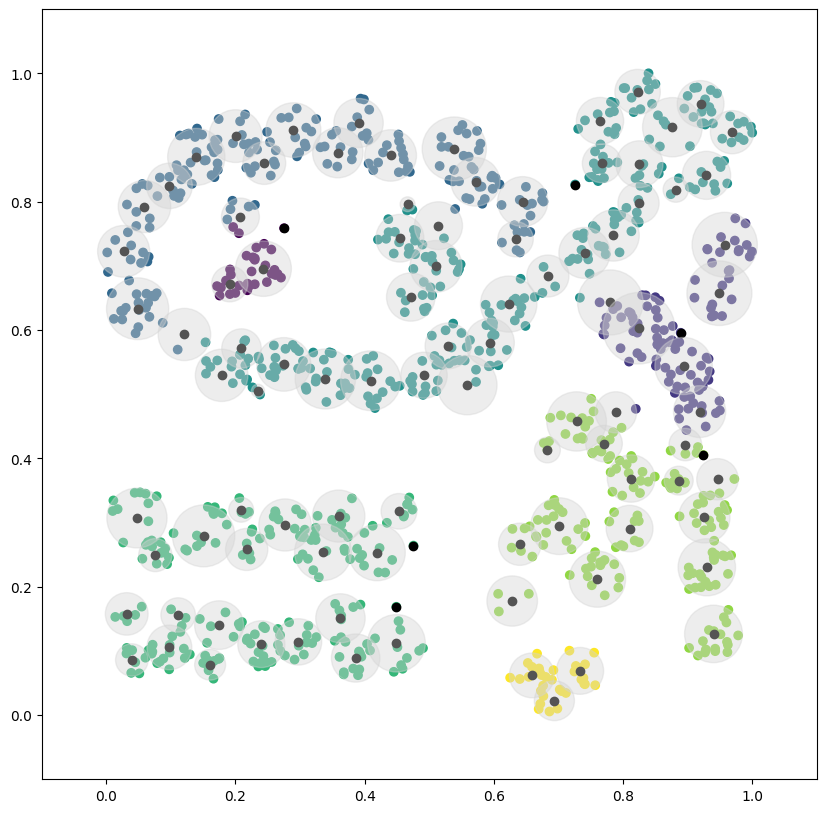

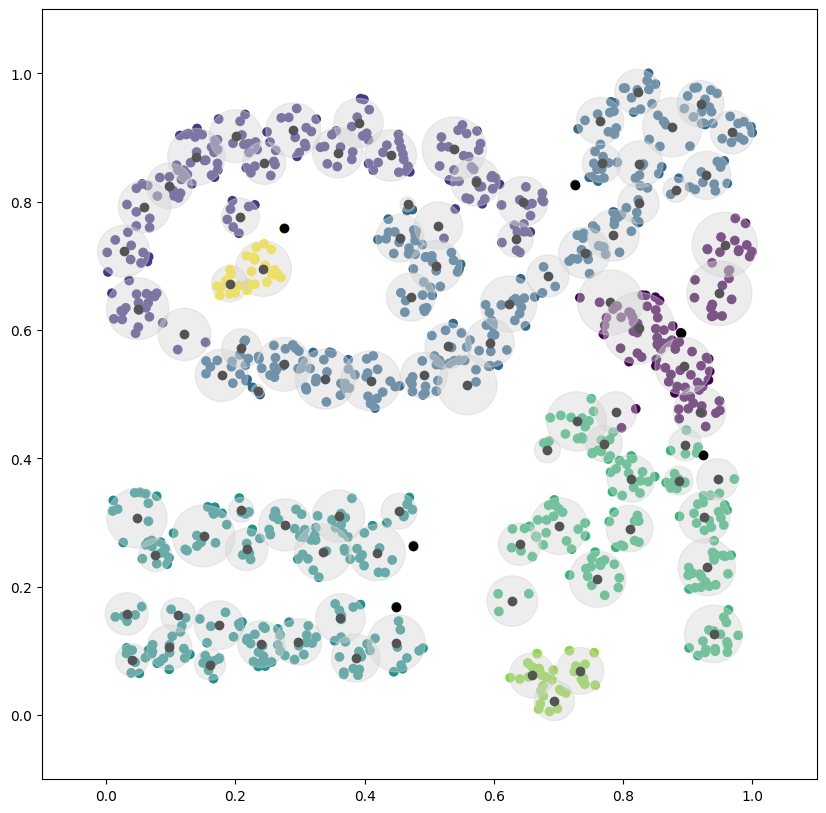

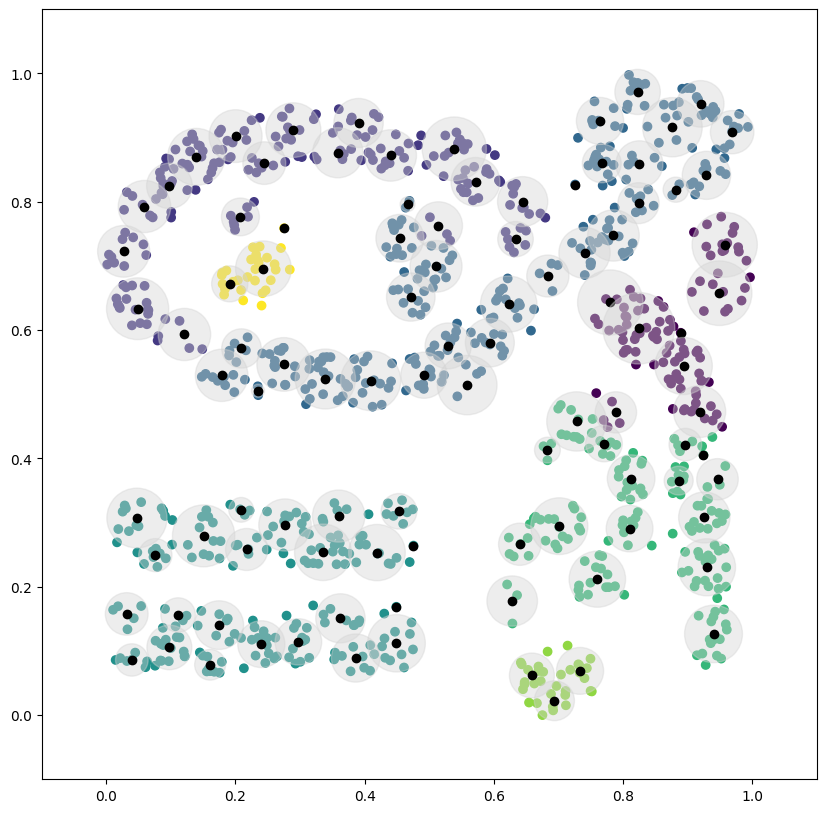

    0    1     2     3     4    5    6    7   8  
0   25     0     0     0    0    0    0   0   0  
1    0     7     0     0    0    0   29   0   0  
2    0     4    37     0    0    0    0   0   0  
3    0     0     0     0   26   33    0   0   0  
4    5     0     0     0   61    0    0   0   0  
5    0     0     0   100    0    0    0   0   0  
6    0   184   123     0    0    0    0   0   0  
7    0     0     0   108    0    0    0   0   0  
8   73     0   114     0   71    0    0   0   0  
Acc: 0.554 NMI: 0.6467883905522943 ARI: 0.4123513724425179 AMI: 0.64175142291139 Pur.: 0.621 Prec.: 0.5258829873281208 Rec.: 0.5257521408281325 F1: 0.5258175559380378 Comp.: 0.6711075026160374 Fowl.: 0.5258175600080822 Homo.: 0.6241701602180811 Clu.Num.: 7 True Clu.Num 9


In [7]:
from method.offlineHandler import GenCluStream
genclustream = GenCluStream(n_macro_clusters=9, max_micro_clusters=100, seed=0, time_gap=10000, offline_datascale=1000, offline_algo="DBHD", offline_args={"min_cluster_size":50, "rho":1.2, "beta": 0.2})
for x in X:
	dp = dict(enumerate(x))
	genclustream.learn_one(dp)
genclustream_labels_train = []
for x in X:
	dp = dict(enumerate(x))
	pred = genclustream.predict_one(dp)
	genclustream_labels_train.append(pred)
    
plt.figure(figsize=(10, 10))
plt.scatter(X[:, 0], X[:, 1], c=genclustream_labels_train)
for id, mc in genclustream.micro_clusters.items():
    mccenter = dict_to_np(mc.center)
    mc_patch = ptc.Circle((float(mccenter[0]), float(mccenter[1])), mc.radius(2), alpha=0.4, color="lightgrey")
    plt.gca().add_patch(mc_patch)
    plt.scatter(float(mccenter[0]), float(mccenter[1]), c="black")
#plt.scatter(clustream_centers[:, 0], clustream_centers[:,1], c=range(len(clustream_centers)), s= 200, edgecolors='red')

plt.ylim(-0.1, 1.1)
plt.xlim(-0.1, 1.1)
plt.show()
    
print(printMetrics(y, genclustream_labels_train))

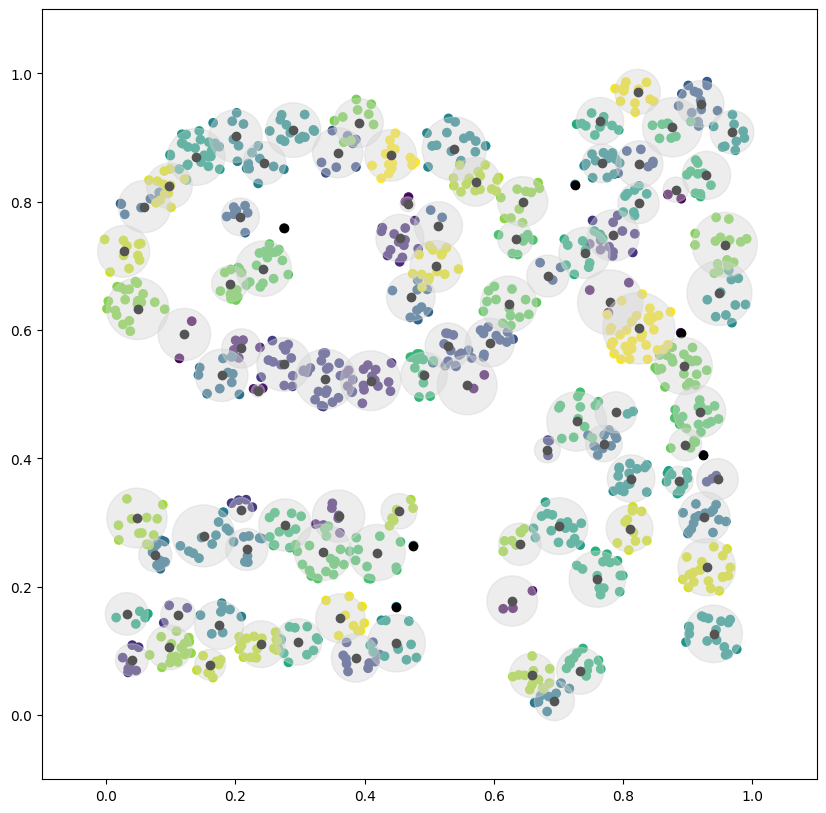

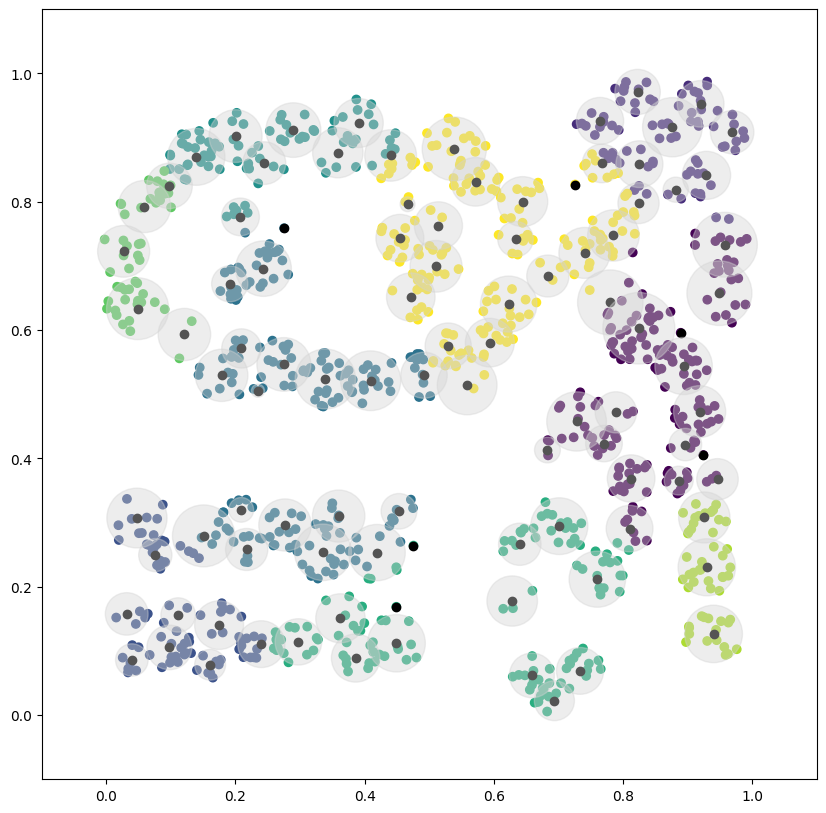

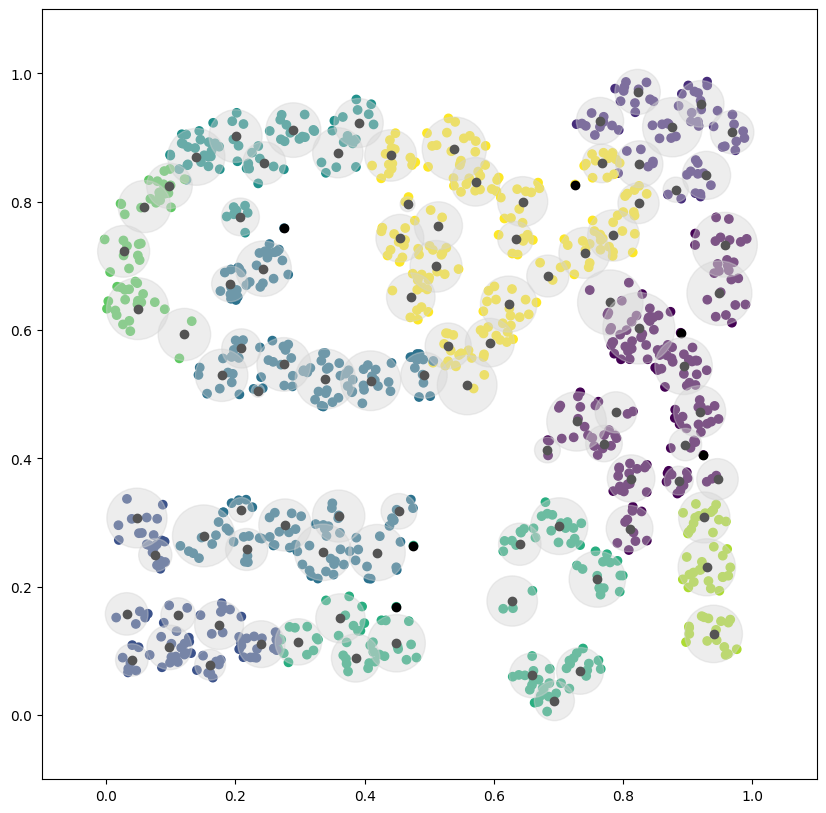

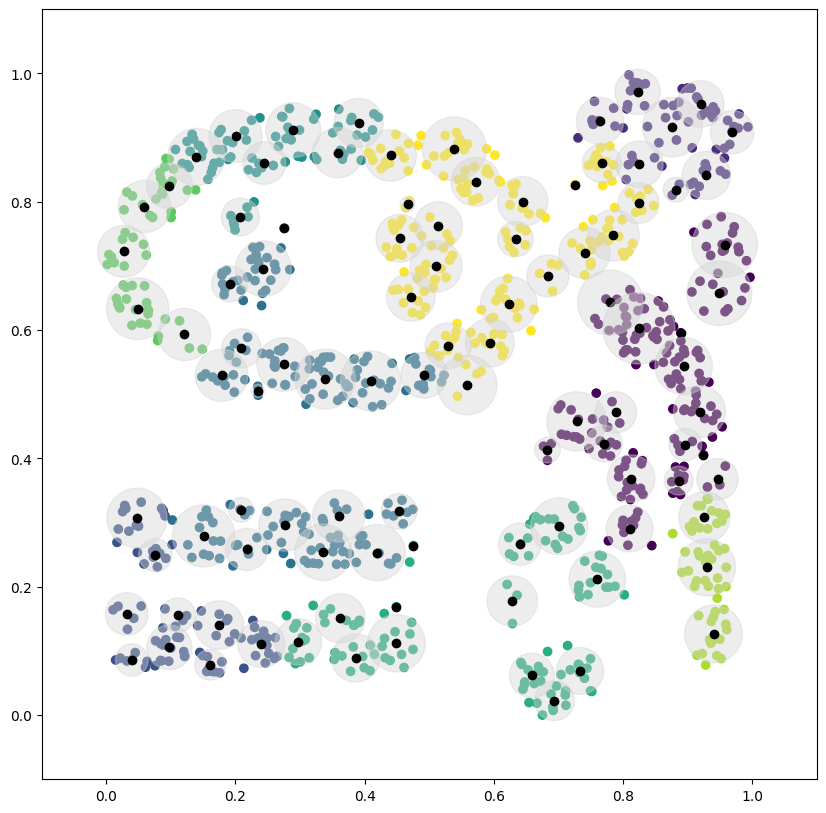

    0    1    2    3    4    5    6    7    8    
0   25    0    0    0    0    0    0    0     0  
1    0    0    0   29    7    0    0    0     0  
2    0    0    0    0    0    0    0    0    41  
3    0    0    0    0    0   59    0    0     0  
4   51    0    0    0    0   15    0    0     0  
5    0    0   22   76    0    2    0    0     0  
6    0    0    0   79   67    0   56    0   105  
7    0    0   65    0    0   43    0    0     0  
8   93   69    0    0    0    0    0   51    45  
Acc: 0.432 NMI: 0.5723781076029442 ARI: 0.27218944708606213 AMI: 0.5649419043133614 Pur.: 0.644 Prec.: 0.4702585507588384 Rec.: 0.33054801053308175 F1: 0.3882161708034263 Comp.: 0.5432283965403026 Fowl.: 0.3942626388456105 Homo.: 0.6048335602924568 Clu.Num.: 9 True Clu.Num 9


In [8]:
from method.offlineHandler import GenCluStream
genclustream = GenCluStream(n_macro_clusters=9, max_micro_clusters=100, seed=0, time_gap=10000, offline_datascale=1000, offline_algo="Spectral")
for x in X:
	dp = dict(enumerate(x))
	genclustream.learn_one(dp)
genclustream_labels_train = []
for x in X:
	dp = dict(enumerate(x))
	pred = genclustream.predict_one(dp)
	genclustream_labels_train.append(pred)
    
plt.figure(figsize=(10, 10))
plt.scatter(X[:, 0], X[:, 1], c=genclustream_labels_train)
for id, mc in genclustream.micro_clusters.items():
    mccenter = dict_to_np(mc.center)
    mc_patch = ptc.Circle((float(mccenter[0]), float(mccenter[1])), mc.radius(2), alpha=0.4, color="lightgrey")
    plt.gca().add_patch(mc_patch)
    plt.scatter(float(mccenter[0]), float(mccenter[1]), c="black")
#plt.scatter(clustream_centers[:, 0], clustream_centers[:,1], c=range(len(clustream_centers)), s= 200, edgecolors='red')

plt.ylim(-0.1, 1.1)
plt.xlim(-0.1, 1.1)
plt.show()
    
print(printMetrics(y, genclustream_labels_train))

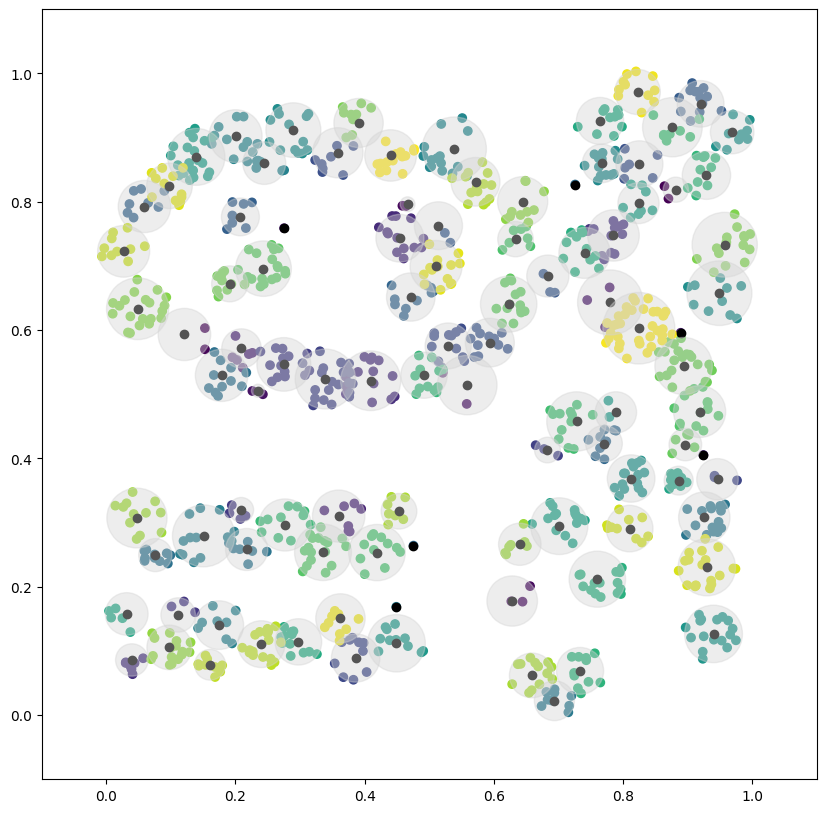

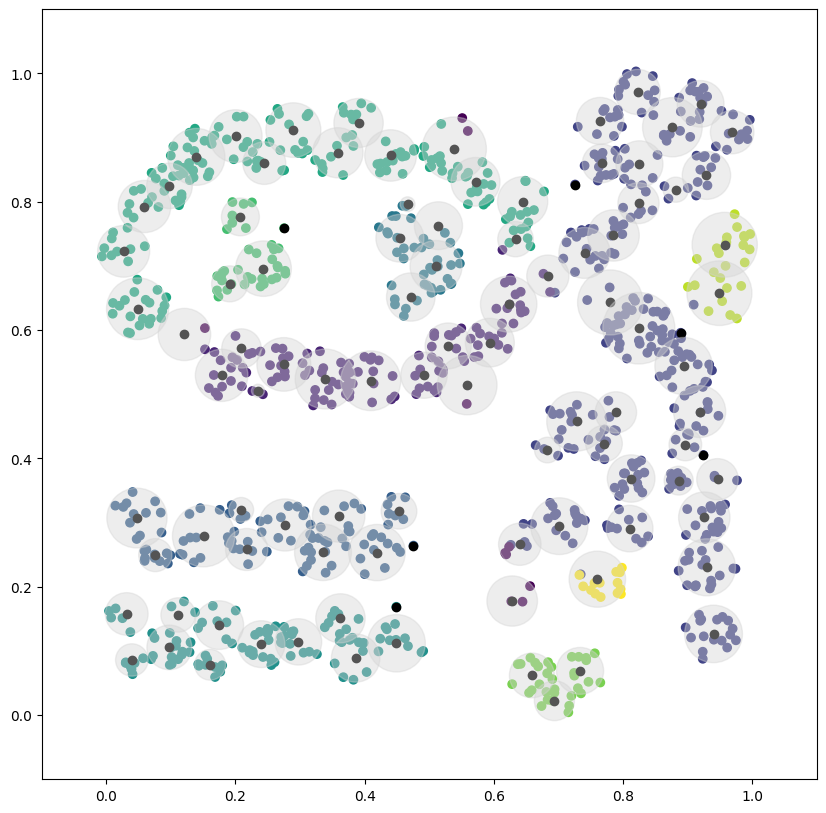

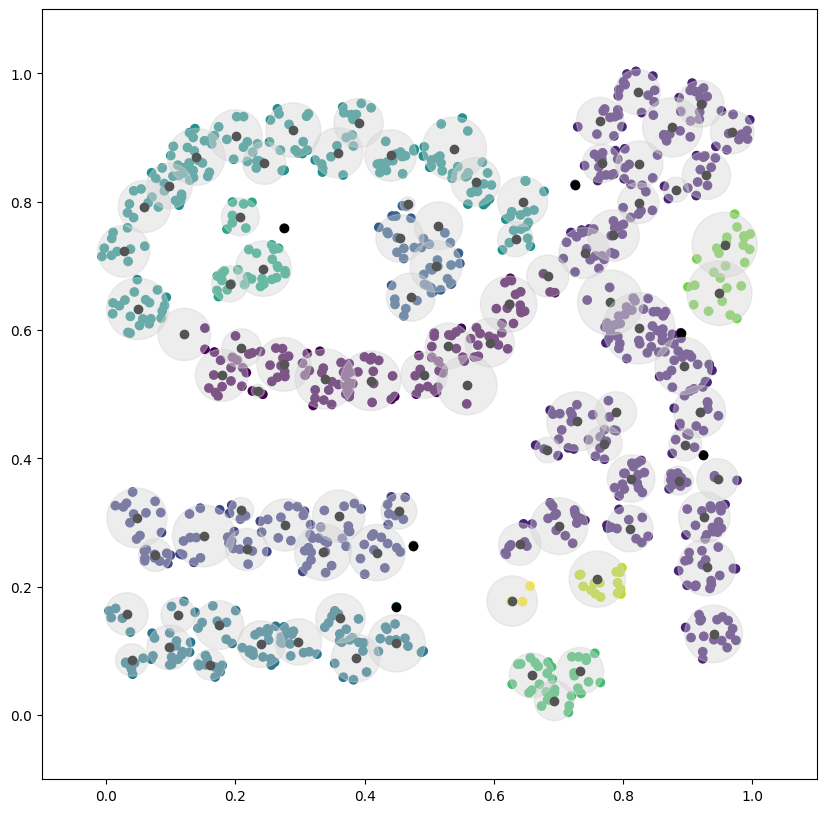

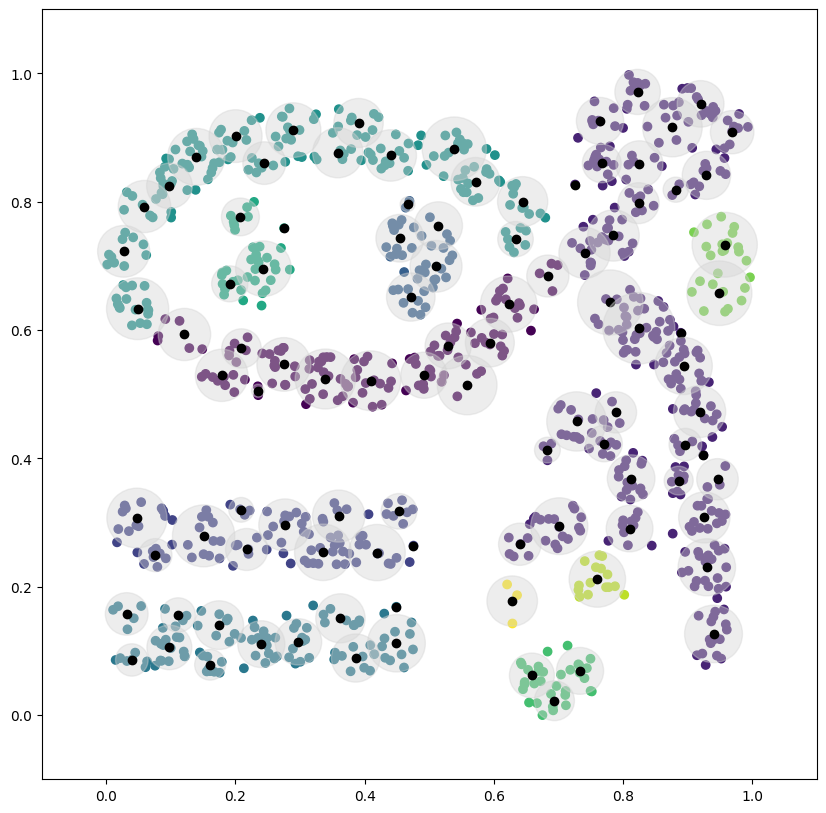

     0     1     2     3    4     5     6    7    8    9    10  
 0     0     0     0    0     0     0    0    0   25    0    0  
 1     0     0     0    0     0     0   36    0    0    0    0  
 2     0     0     0   41     0     0    0    0    0    0    0  
 3     0    23     0    0     0     0    0   33    0    0    3  
 4     0    51     0    0     0     0    0    0    0   15    0  
 5     0     0   100    0     0     0    0    0    0    0    0  
 6   129     0     0    0     0   178    0    0    0    0    0  
 7     0     0     0    0   108     0    0    0    0    0    0  
 8     0   258     0    0     0     0    0    0    0    0    0  
 9     0     0     0    0     0     0    0    0    0    0    0  
10     0     0     0    0     0     0    0    0    0    0    0  
Acc: 0.794 NMI: 0.8647702105547758 ARI: 0.706350875440712 AMI: 0.8617329004811077 Pur.: 0.926 Prec.: 0.7798933408639173 Rec.: 0.7444068921188497 F1: 0.7617370456221124 Comp.: 0.8487514878475388 Fowl.: 0.7619435530645923 

In [9]:
from method.offlineHandler import GenCluStream
genclustream = GenCluStream(n_macro_clusters=9, max_micro_clusters=100, seed=0, time_gap=10000, offline_datascale=1000, offline_algo="DBSCAN", offline_args={"eps":0.05, "min_samples":10})
for x in X:
	dp = dict(enumerate(x))
	genclustream.learn_one(dp)
genclustream_labels_train = []
for x in X:
	dp = dict(enumerate(x))
	pred = genclustream.predict_one(dp)
	genclustream_labels_train.append(pred)
    
plt.figure(figsize=(10, 10))
plt.scatter(X[:, 0], X[:, 1], c=genclustream_labels_train)
for id, mc in genclustream.micro_clusters.items():
    mccenter = dict_to_np(mc.center)
    mc_patch = ptc.Circle((float(mccenter[0]), float(mccenter[1])), mc.radius(2), alpha=0.4, color="lightgrey")
    plt.gca().add_patch(mc_patch)
    plt.scatter(float(mccenter[0]), float(mccenter[1]), c="black")
#plt.scatter(clustream_centers[:, 0], clustream_centers[:,1], c=range(len(clustream_centers)), s= 200, edgecolors='red')

plt.ylim(-0.1, 1.1)
plt.xlim(-0.1, 1.1)
plt.show()
    
print(printMetrics(y, genclustream_labels_train))

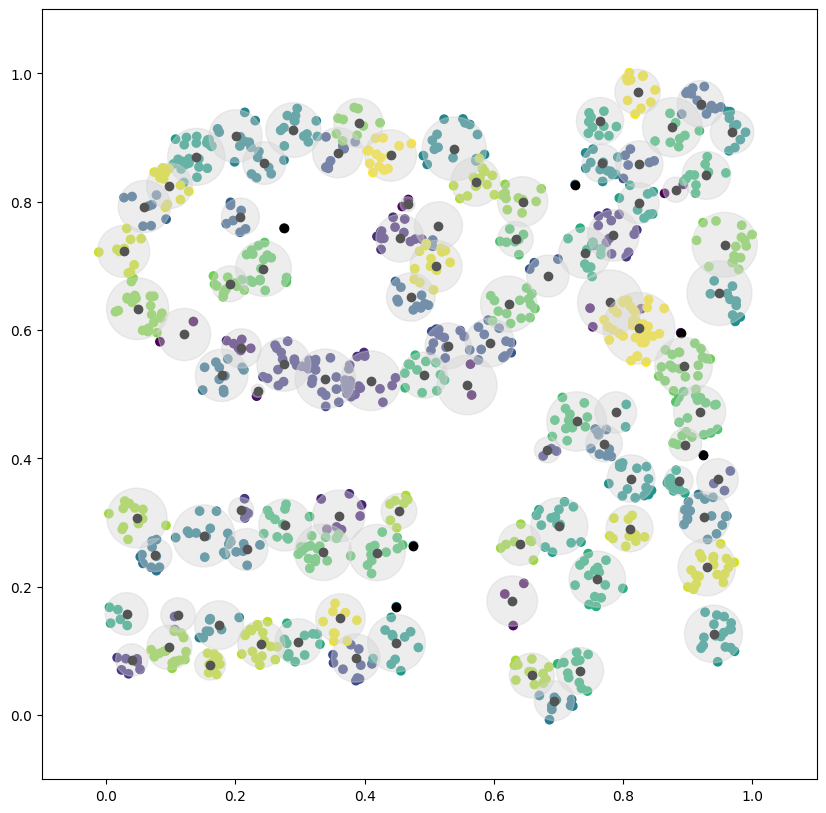

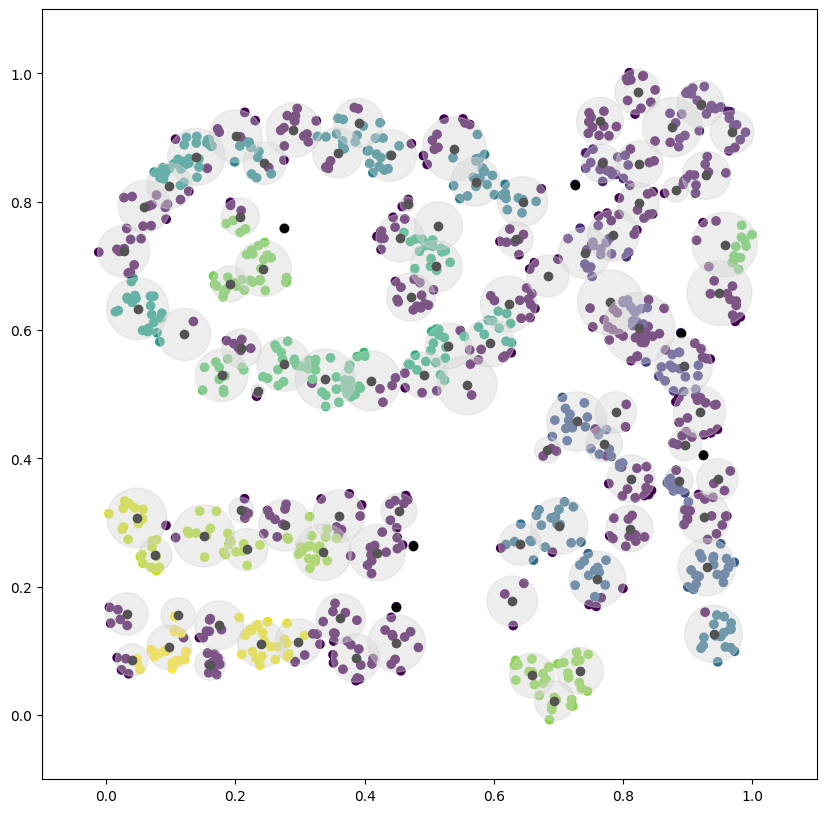

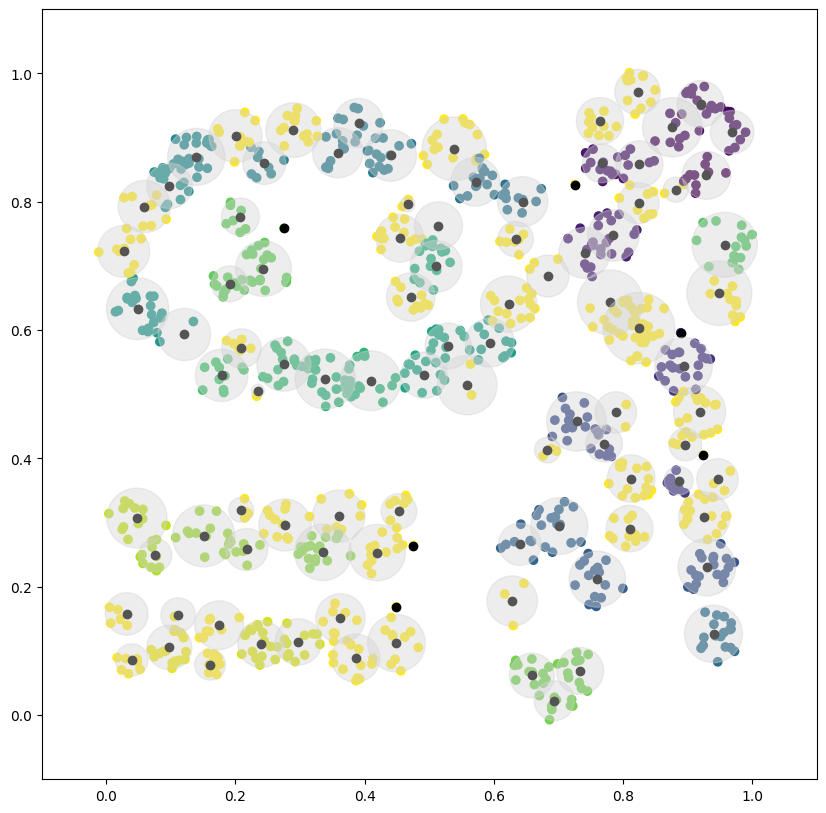

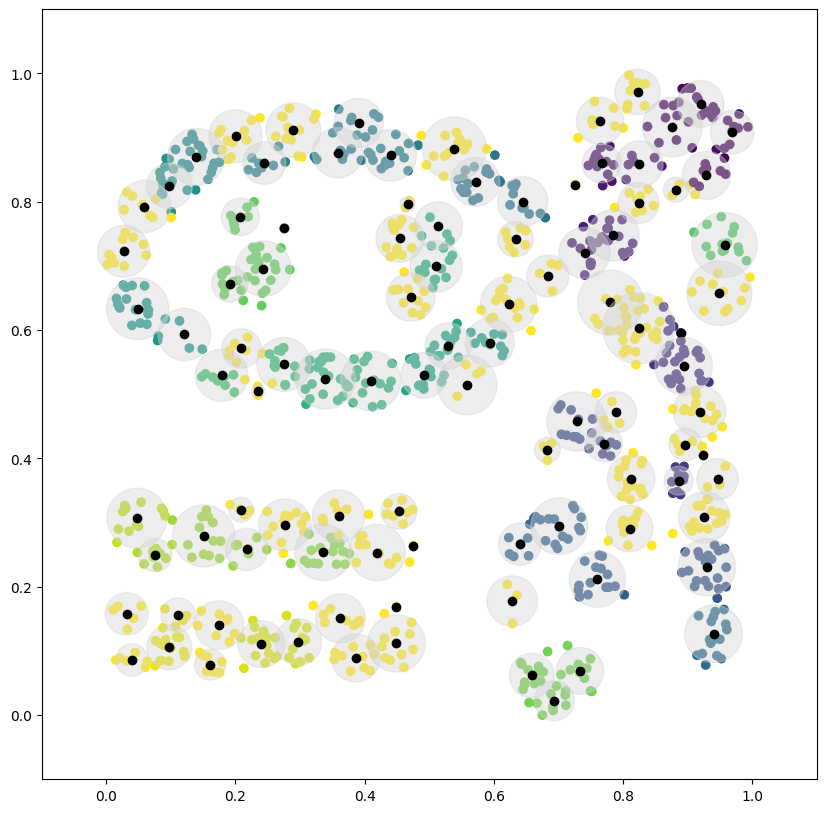

     0   1    2    3    4   5    6    7   8    9    10   11   12   13   14   15   16   17   18   19   20   21   22   23   24   25   26   27   28   29   30   31   32   33   34   
 0   0    0    0    0   0    0    0   0    0    0    0    0    0    0    0    0    0    0    0    0    0    0    0    0    0   14    0    0    0    0    0    0    0    0    11  
 1   0    0    0    0   0    0    0   0    0    0    0    0    0    0    0    0    0    0    0    0    0    0    0    0    0    0   36    0    0    0    0    0    0    0     0  
 2   0    0    0    0   0    0    0   0    0    0    0    0    0    0    0    0    0    0    0    0    0   16    0    0    0    0    0    0    0    0    0    0    0    0    25  
 3   0    0    0    0   0    0    0   0    0    0    0   23    0    0    0    0    0    0    0    0    0    0    0    0    0    0    0   33    0    0    0    0    0    0     3  
 4   0    0    0    0   0    0    0   8   10    0   15    0    0    0    0    0    0    0    0    0    0    0 

In [11]:
from method.offlineHandler import GenCluStream
genclustream = GenCluStream(n_macro_clusters=9, max_micro_clusters=100, seed=0, time_gap=10000, offline_datascale=1000, offline_algo="OPTICS", offline_args={"min_samples":10})
for x in X:
	dp = dict(enumerate(x))
	genclustream.learn_one(dp)
genclustream_labels_train = []
for x in X:
	dp = dict(enumerate(x))
	pred = genclustream.predict_one(dp)
	genclustream_labels_train.append(pred)
    
plt.figure(figsize=(10, 10))
plt.scatter(X[:, 0], X[:, 1], c=genclustream_labels_train)
for id, mc in genclustream.micro_clusters.items():
    mccenter = dict_to_np(mc.center)
    mc_patch = ptc.Circle((float(mccenter[0]), float(mccenter[1])), mc.radius(2), alpha=0.4, color="lightgrey")
    plt.gca().add_patch(mc_patch)
    plt.scatter(float(mccenter[0]), float(mccenter[1]), c="black")
#plt.scatter(clustream_centers[:, 0], clustream_centers[:,1], c=range(len(clustream_centers)), s= 200, edgecolors='red')

plt.ylim(-0.1, 1.1)
plt.xlim(-0.1, 1.1)
plt.show()
    
print(printMetrics(y, genclustream_labels_train))

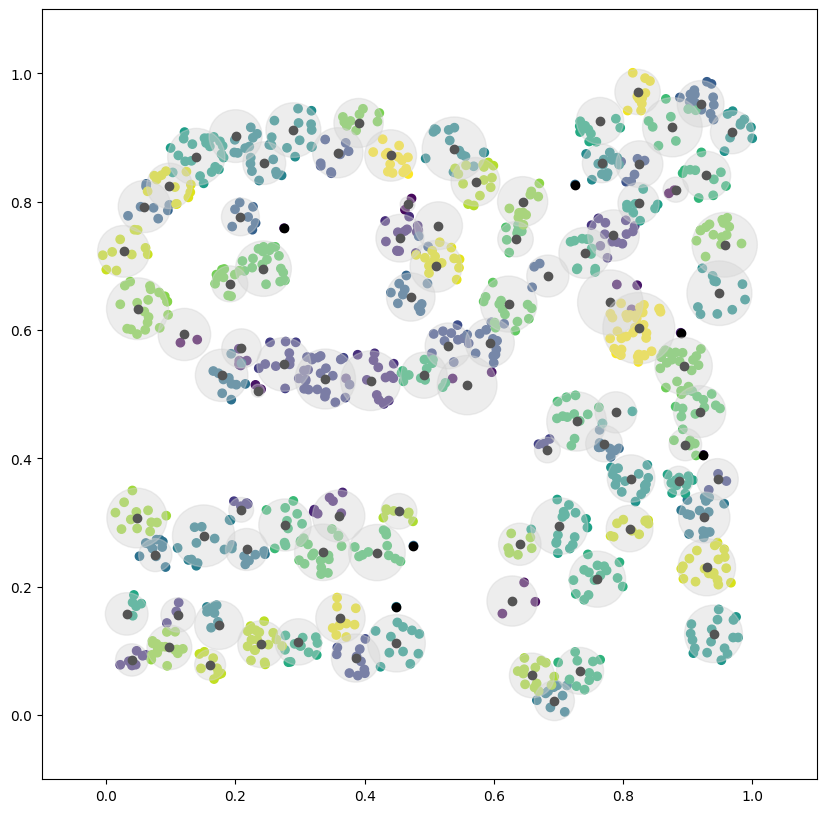

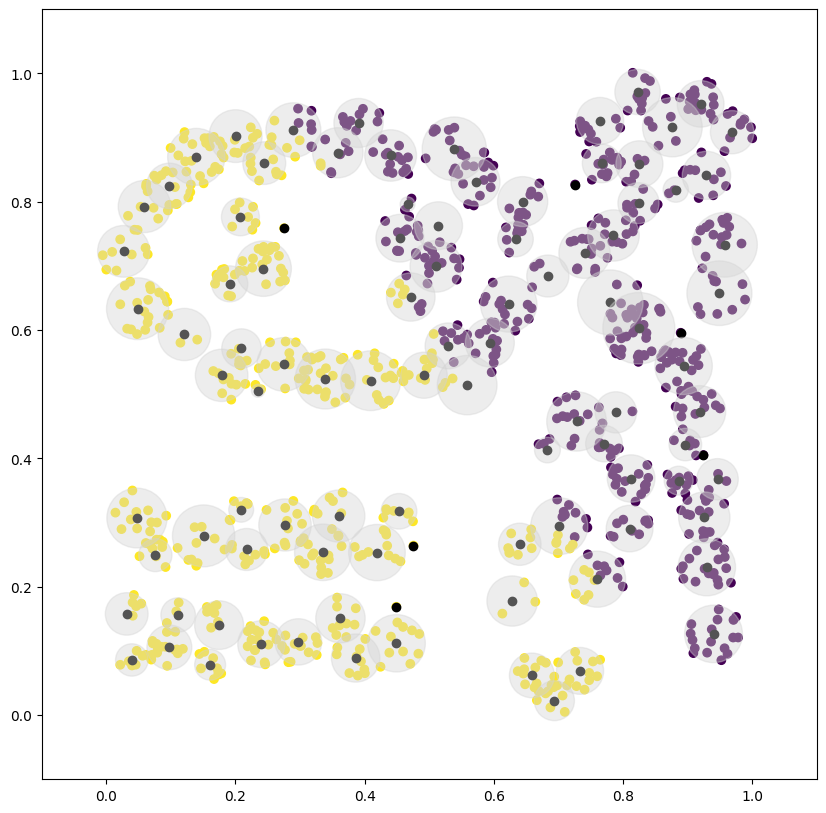

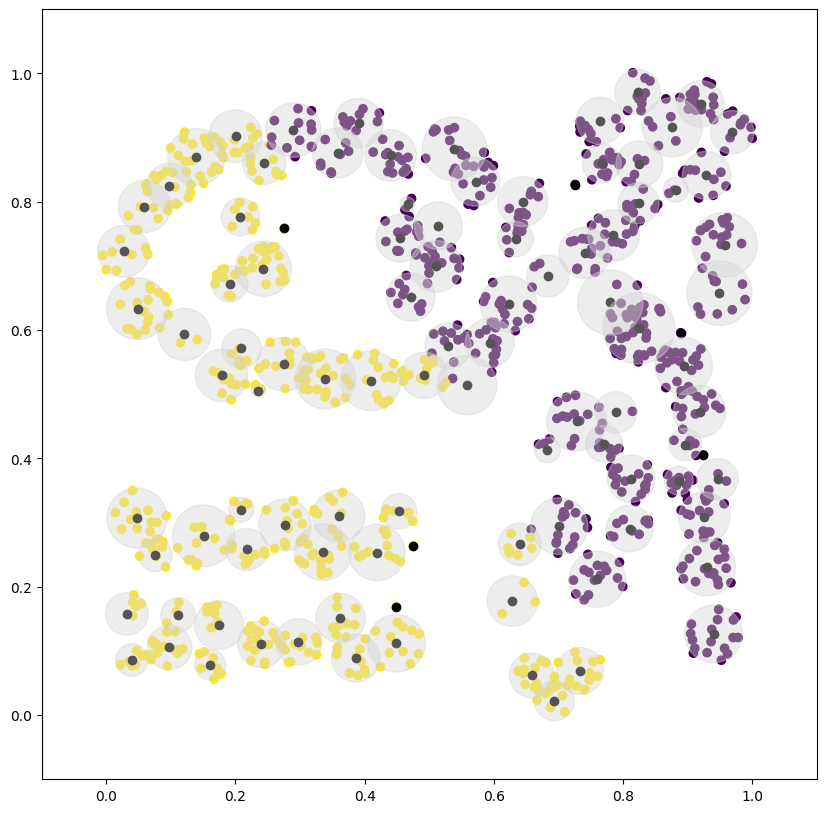

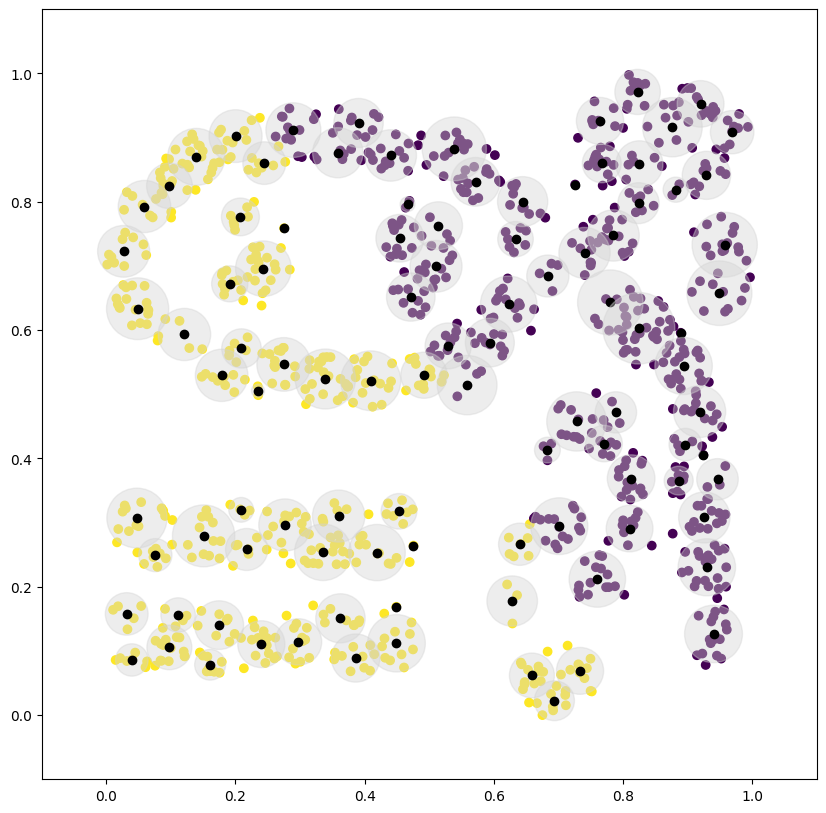

    0     1     2   3   4   5   6   7   8  
0    25     0   0   0   0   0   0   0   0  
1     0    36   0   0   0   0   0   0   0  
2    41     0   0   0   0   0   0   0   0  
3    16    43   0   0   0   0   0   0   0  
4    66     0   0   0   0   0   0   0   0  
5     0   100   0   0   0   0   0   0   0  
6   135   172   0   0   0   0   0   0   0  
7     0   108   0   0   0   0   0   0   0  
8   258     0   0   0   0   0   0   0   0  
Acc: 0.43 NMI: 0.34721919391048794 ARI: 0.19187504986602372 AMI: 0.3451541875724429 Pur.: 0.43 Prec.: 0.2888355409047659 Rec.: 0.7521408281324514 F1: 0.41738700203371887 Comp.: 0.6447529650614032 Fowl.: 0.4660954869232217 Homo.: 0.23758225197979876 Clu.Num.: 2 True Clu.Num 9


In [12]:
from method.offlineHandler import GenCluStream
genclustream = GenCluStream(n_macro_clusters=9, max_micro_clusters=100, seed=0, time_gap=10000, offline_datascale=1000, offline_algo="MeanShift")
for x in X:
	dp = dict(enumerate(x))
	genclustream.learn_one(dp)
genclustream_labels_train = []
for x in X:
	dp = dict(enumerate(x))
	pred = genclustream.predict_one(dp)
	genclustream_labels_train.append(pred)
    
plt.figure(figsize=(10, 10))
plt.scatter(X[:, 0], X[:, 1], c=genclustream_labels_train)
for id, mc in genclustream.micro_clusters.items():
    mccenter = dict_to_np(mc.center)
    mc_patch = ptc.Circle((float(mccenter[0]), float(mccenter[1])), mc.radius(2), alpha=0.4, color="lightgrey")
    plt.gca().add_patch(mc_patch)
    plt.scatter(float(mccenter[0]), float(mccenter[1]), c="black")
#plt.scatter(clustream_centers[:, 0], clustream_centers[:,1], c=range(len(clustream_centers)), s= 200, edgecolors='red')

plt.ylim(-0.1, 1.1)
plt.xlim(-0.1, 1.1)
plt.show()
    
print(printMetrics(y, genclustream_labels_train))

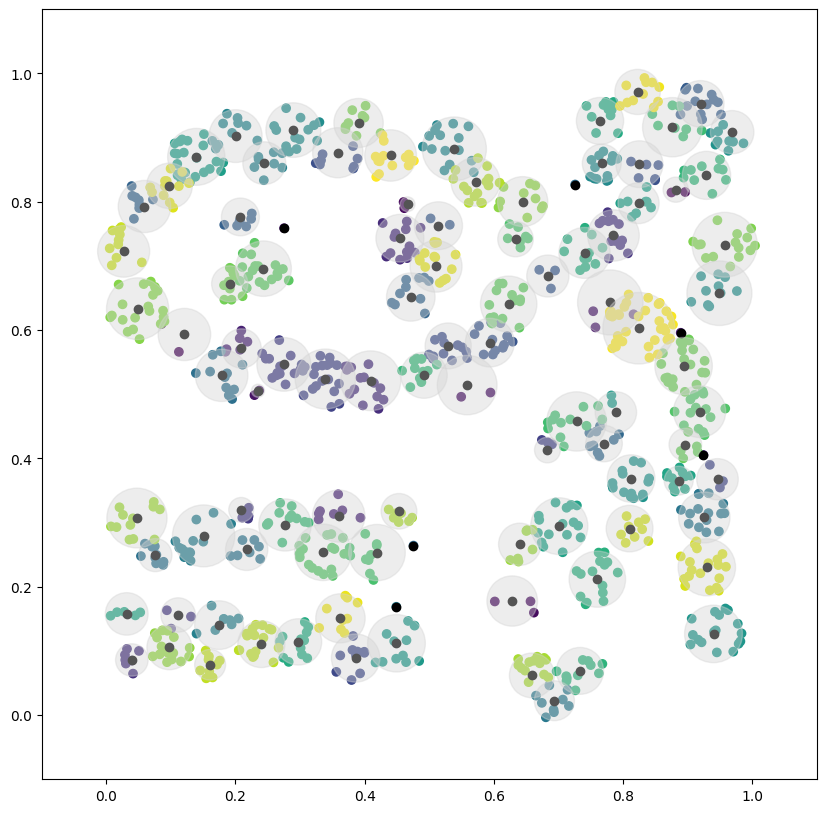

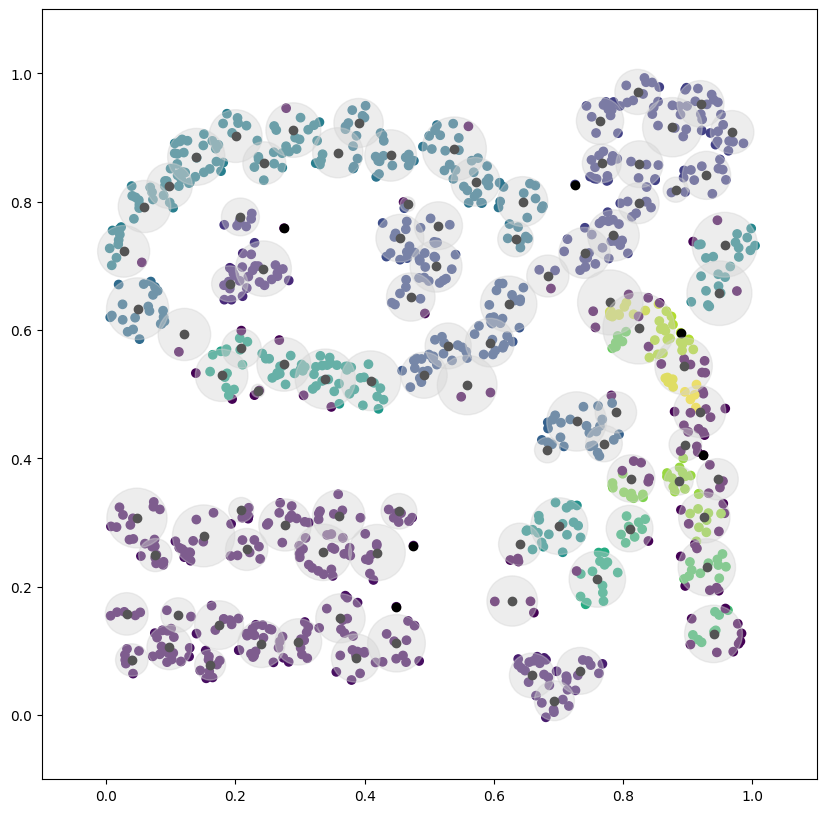

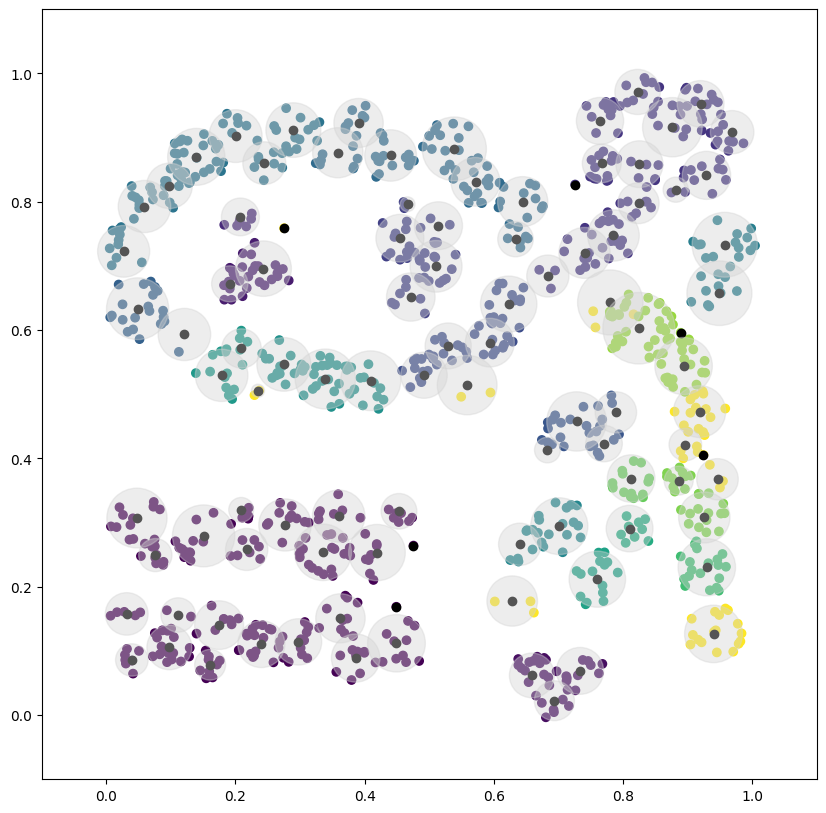

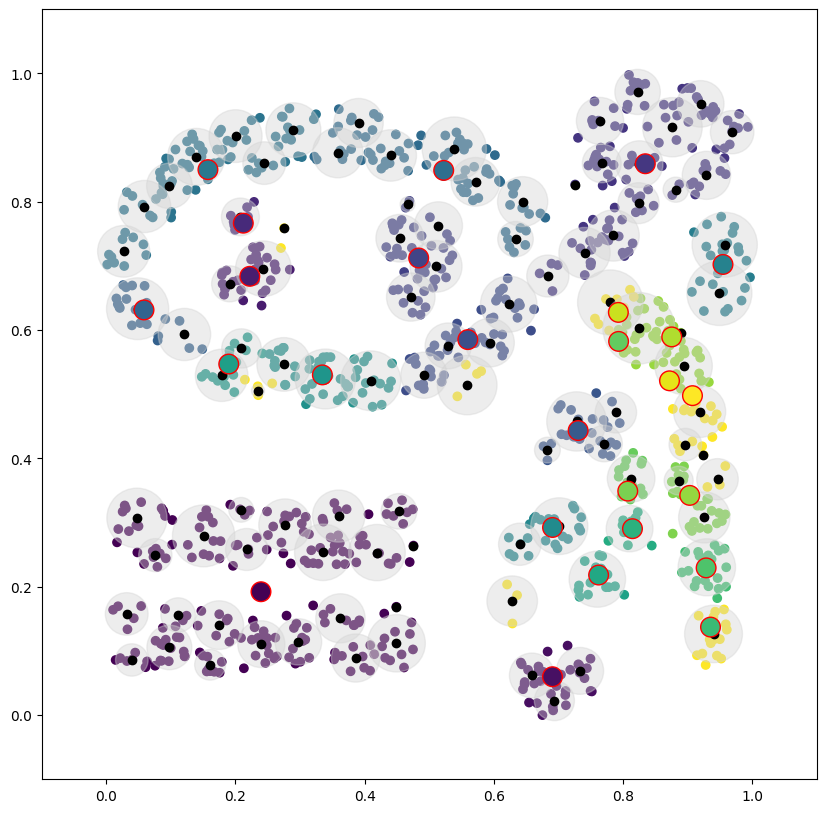

     0     1    2    3   4     5    6    7    8    9    10   11   12   13   14   15   16   18   20   21   22   26  
 0     0    0    0   0     0    0    0    0    0    0    0   25    0    0    0    0    0    0    0    0    0    0  
 1     0    0   27   7     0    0    0    0    0    0    0    0    0    0    0    0    0    0    0    0    0    2  
 2     0    0    0   0     0   41    0    0    0    0    0    0    0    0    0    0    0    0    0    0    0    0  
 3     0   33    0   0     0    0    0    0    0    0    0    0   23    0    0    0    0    0    0    0    0    3  
 4     0    0    0   0     0    0    0   26    0    0    0    0    0    0    0   15   10    0   15    0    0    0  
 5   100    0    0   0     0    0    0    0    0    0    0    0    0    0    0    0    0    0    0    0    0    0  
 6     0    0    0   0     4    0   48    0   23   78   83    0    0   48   15    0    0    0    0    0    0    8  
 7   108    0    0   0     0    0    0    0    0    0    0    0    0    

In [16]:
from method.offlineHandler import GenCluStream
genclustream = GenCluStream(n_macro_clusters=9, max_micro_clusters=100, seed=0, time_gap=10000, offline_datascale=1000, offline_algo="HDBSCAN")
for x in X:
	dp = dict(enumerate(x))
	genclustream.learn_one(dp)
genclustream_labels_train = []
for x in X:
	dp = dict(enumerate(x))
	pred = genclustream.predict_one(dp)
	genclustream_labels_train.append(pred)
    
clustream_centers = genclustream.centers
plt.figure(figsize=(10, 10))
plt.scatter(X[:, 0], X[:, 1], c=genclustream_labels_train)
for id, mc in genclustream.micro_clusters.items():
    mccenter = dict_to_np(mc.center)
    mc_patch = ptc.Circle((float(mccenter[0]), float(mccenter[1])), mc.radius(2), alpha=0.4, color="lightgrey")
    plt.gca().add_patch(mc_patch)
    plt.scatter(float(mccenter[0]), float(mccenter[1]), c="black")
plt.scatter(clustream_centers[:, 0], clustream_centers[:,1], c=range(len(clustream_centers)), s= 200, edgecolors='red')

plt.ylim(-0.1, 1.1)
plt.xlim(-0.1, 1.1)
plt.show()
    
print(printMetrics(y, genclustream_labels_train))

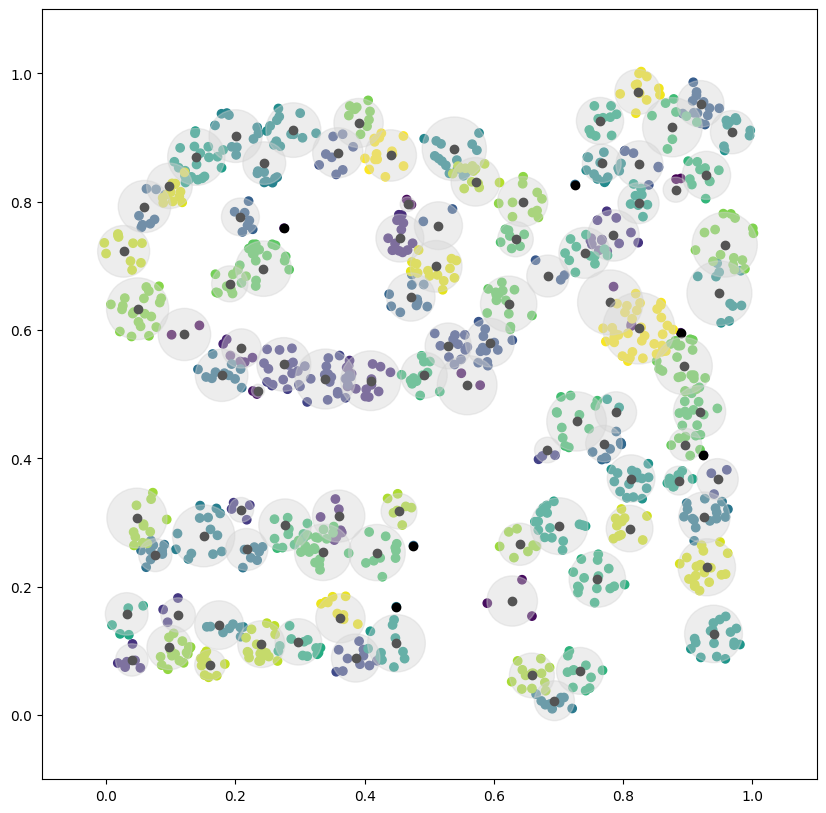

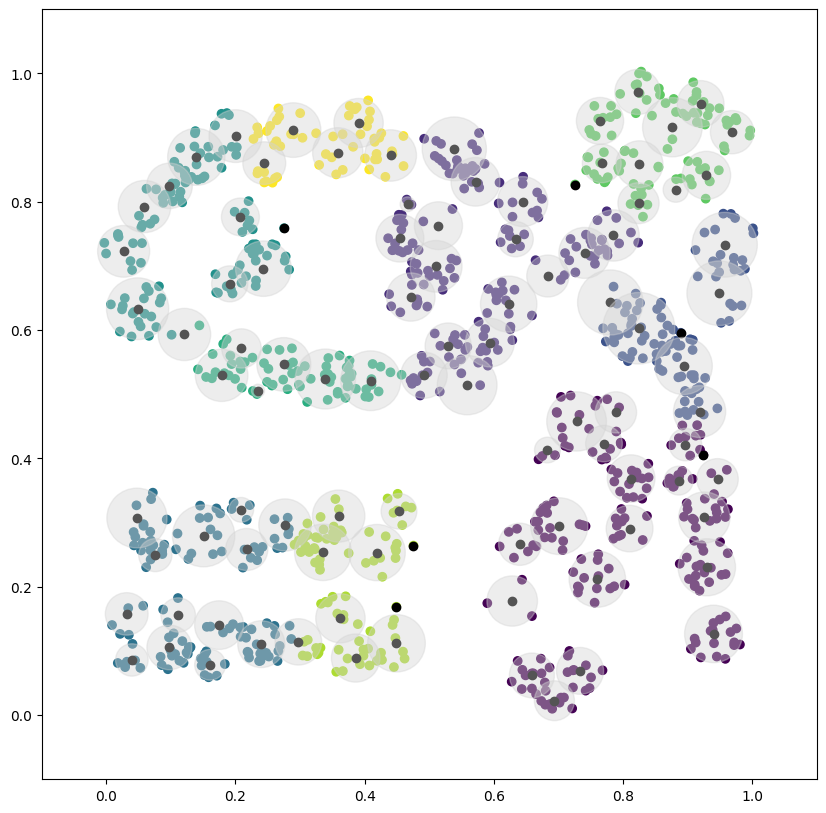

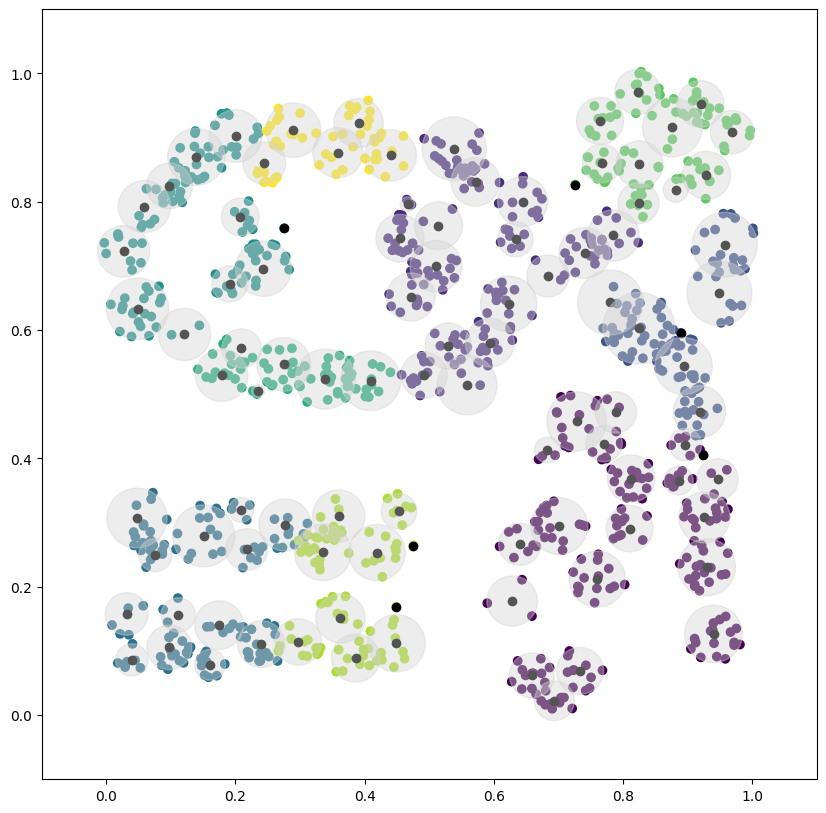

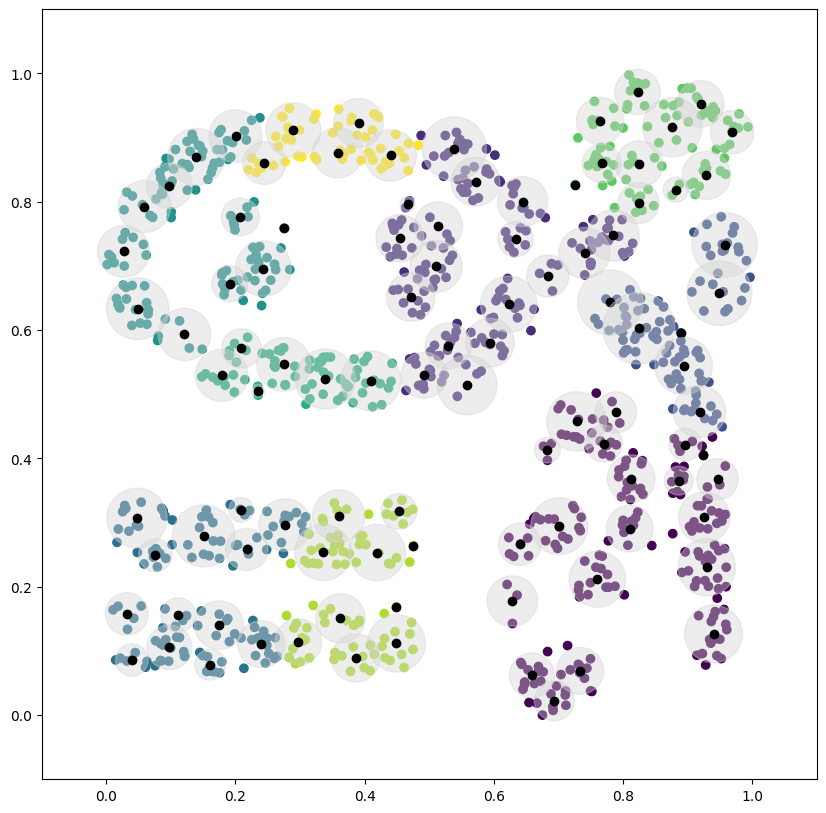

    0    1     2    3    4    5    6    7    8   
0    0     0   25    0    0    0    0    0    0  
1    0     0    0    0   36    0    0    0    0  
2    0    41    0    0    0    0    0    0    0  
3   59     0    0    0    0    0    0    0    0  
4   66     0    0    0    0    0    0    0    0  
5    0     0    0   58    0    0    0   42    0  
6    0   103    0    0   85   67    0    0   52  
7    0     0    0   65    0    0    0   43    0  
8   71    23   73    0    0    0   91    0    0  
Acc: 0.433 NMI: 0.6164423487829425 ARI: 0.30431875477640213 AMI: 0.6098656792177714 Pur.: 0.65 Prec.: 0.5169495517279279 Rec.: 0.341329905243733 F1: 0.4111722355086264 Comp.: 0.5801548386134475 Fowl.: 0.42005992609041376 Homo.: 0.6575721553193421 Clu.Num.: 9 True Clu.Num 9


In [18]:
from method.offlineHandler import GenCluStream
genclustream = GenCluStream(n_macro_clusters=9, max_micro_clusters=100, seed=0, time_gap=10000, offline_datascale=1000, offline_algo="Agglomerative")
for x in X:
	dp = dict(enumerate(x))
	genclustream.learn_one(dp)
genclustream_labels_train = []
for x in X:
	dp = dict(enumerate(x))
	pred = genclustream.predict_one(dp)
	genclustream_labels_train.append(pred)
    
plt.figure(figsize=(10, 10))
plt.scatter(X[:, 0], X[:, 1], c=genclustream_labels_train)
for id, mc in genclustream.micro_clusters.items():
    mccenter = dict_to_np(mc.center)
    mc_patch = ptc.Circle((float(mccenter[0]), float(mccenter[1])), mc.radius(2), alpha=0.4, color="lightgrey")
    plt.gca().add_patch(mc_patch)
    plt.scatter(float(mccenter[0]), float(mccenter[1]), c="black")
#plt.scatter(clustream_centers[:, 0], clustream_centers[:,1], c=range(len(clustream_centers)), s= 200, edgecolors='red')

plt.ylim(-0.1, 1.1)
plt.xlim(-0.1, 1.1)
plt.show()
    
print(printMetrics(y, genclustream_labels_train))